# EDA on AMCAT Data

# Problem Statement:

+ Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.
+ Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)


# Objective:

+ To test and find if there is any relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)

## Importing the required libraries

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import zscore
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import datetime as dt

## Extracting the csv file

In [2]:
df = pd.read_csv(r"data.xlsx - Sheet1.csv")

In [3]:
df

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.30,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.40,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.00,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.60,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.00,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,train,47916,280000.0,10/1/11 0:00,10/1/12 0:00,software engineer,New Delhi,m,4/15/87 0:00,52.09,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,train,752781,100000.0,7/1/13 0:00,7/1/13 0:00,technical writer,Hyderabad,f,8/27/92 0:00,90.00,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,train,355888,320000.0,7/1/13 0:00,present,associate software engineer,Bangalore,m,7/3/91 0:00,81.86,...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,train,947111,200000.0,7/1/14 0:00,1/1/15 0:00,software developer,Asifabadbanglore,f,3/20/92 0:00,78.72,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


## set_option is used to display all the columns.

In [4]:
pd.set_option('display.max_columns',39)

In [5]:
df

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.30,"board ofsecondary education,ap",2007,95.80,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,train,47916,280000.0,10/1/11 0:00,10/1/12 0:00,software engineer,New Delhi,m,4/15/87 0:00,52.09,cbse,2006,55.50,cbse,6268,2,B.Tech/B.E.,information technology,61.50,6268,0,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,train,752781,100000.0,7/1/13 0:00,7/1/13 0:00,technical writer,Hyderabad,f,8/27/92 0:00,90.00,state board,2009,93.00,state board,4883,2,B.Tech/B.E.,electronics and communication engineering,77.30,4883,1,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,train,355888,320000.0,7/1/13 0:00,present,associate software engineer,Bangalore,m,7/3/91 0:00,81.86,"bse,odisha",2008,65.50,"chse,odisha",9786,2,B.Tech/B.E.,computer engineering,70.00,9786,0,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,train,947111,200000.0,7/1/14 0:00,1/1/15 0:00,software developer,Asifabadbanglore,f,3/20/92 0:00,78.72,state board,2010,69.88,state board,979,2,B.Tech/B.E.,computer science & engineering,70.42,979,1,Karnataka,2014,450,410,320,0.744758,445,-1,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             3998 non-null   object 
 1   ID                     3998 non-null   int64  
 2   Salary                 3998 non-null   float64
 3   DOJ                    3998 non-null   object 
 4   DOL                    3998 non-null   object 
 5   Designation            3998 non-null   object 
 6   JobCity                3998 non-null   object 
 7   Gender                 3998 non-null   object 
 8   DOB                    3998 non-null   object 
 9   10percentage           3998 non-null   float64
 10  10board                3998 non-null   object 
 11  12graduation           3998 non-null   int64  
 12  12percentage           3998 non-null   float64
 13  12board                3998 non-null   object 
 14  CollegeID              3998 non-null   int64  
 15  Coll

## Data Cleaning

In [7]:
df.drop(['Unnamed: 0',],axis=1,inplace=True)

In [8]:
df

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.30,"board ofsecondary education,ap",2007,95.80,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,47916,280000.0,10/1/11 0:00,10/1/12 0:00,software engineer,New Delhi,m,4/15/87 0:00,52.09,cbse,2006,55.50,cbse,6268,2,B.Tech/B.E.,information technology,61.50,6268,0,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,752781,100000.0,7/1/13 0:00,7/1/13 0:00,technical writer,Hyderabad,f,8/27/92 0:00,90.00,state board,2009,93.00,state board,4883,2,B.Tech/B.E.,electronics and communication engineering,77.30,4883,1,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,355888,320000.0,7/1/13 0:00,present,associate software engineer,Bangalore,m,7/3/91 0:00,81.86,"bse,odisha",2008,65.50,"chse,odisha",9786,2,B.Tech/B.E.,computer engineering,70.00,9786,0,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,947111,200000.0,7/1/14 0:00,1/1/15 0:00,software developer,Asifabadbanglore,f,3/20/92 0:00,78.72,state board,2010,69.88,state board,979,2,B.Tech/B.E.,computer science & engineering,70.42,979,1,Karnataka,2014,450,410,320,0.744758,445,-1,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [9]:
df.set_index('ID',inplace=True)

In [10]:
df

,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.30,"board ofsecondary education,ap",2007,95.80,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47916,280000.0,10/1/11 0:00,10/1/12 0:00,software engineer,New Delhi,m,4/15/87 0:00,52.09,cbse,2006,55.50,cbse,6268,2,B.Tech/B.E.,information technology,61.50,6268,0,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
752781,100000.0,7/1/13 0:00,7/1/13 0:00,technical writer,Hyderabad,f,8/27/92 0:00,90.00,state board,2009,93.00,state board,4883,2,B.Tech/B.E.,electronics and communication engineering,77.30,4883,1,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
355888,320000.0,7/1/13 0:00,present,associate software engineer,Bangalore,m,7/3/91 0:00,81.86,"bse,odisha",2008,65.50,"chse,odisha",9786,2,B.Tech/B.E.,computer engineering,70.00,9786,0,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615


## Fuzzy-wuzzy is used to correct the spellings of the words.

In [11]:
from fuzzywuzzy import process

def correct_spelling_errors(target_word="", choices=[], threshold=60):
    match, score = process.extractOne(target_word, choices)
    if score >= threshold:
        return match
    else:
        return target_word

In [12]:
df['JobCity'].unique()

array(['Bangalore', 'Indore', 'Chennai', 'Gurgaon', 'Manesar',
       'Hyderabad', 'Banglore', 'Noida', 'Kolkata', 'Pune', '-1',
       'mohali', 'Jhansi', 'Delhi', 'Hyderabad ', 'Bangalore ', 'noida',
       'delhi', 'Bhubaneswar', 'Navi Mumbai', 'Mumbai', 'New Delhi',
       'Mangalore', 'Rewari', 'Gaziabaad', 'Bhiwadi', 'Mysore', 'Rajkot',
       'Greater Noida', 'Jaipur', 'noida ', 'HYDERABAD', 'mysore',
       'THANE', 'Maharajganj', 'Thiruvananthapuram', 'Punchkula',
       'Bhubaneshwar', 'Pune ', 'coimbatore', 'Dhanbad', 'Lucknow',
       'Trivandrum', 'kolkata', 'mumbai', 'Gandhi Nagar', 'Una',
       'Daman and Diu', 'chennai', 'GURGOAN', 'vsakhapttnam', 'pune',
       'Nagpur', 'Bhagalpur', 'new delhi - jaisalmer', 'Coimbatore',
       'Ahmedabad', 'Kochi/Cochin', 'Bankura', 'Bengaluru', 'Mysore ',
       'Kanpur ', 'jaipur', 'Gurgaon ', 'bangalore', 'CHENNAI',
       'Vijayawada', 'Kochi', 'Beawar', 'Alwar', 'NOIDA', 'Greater noida',
       'Siliguri ', 'raipur', 'gurgaon',

In [13]:
choices = ["Bangalore","Indore","Chennai","Gurgaon","Hyderabad","Kolkata","Pune","Noida","Mohali","Jhansi","Delhi","Bhubaneswar",
           "Mumbai","Mangalore","Rewari","Gaziabad","Bhiwadi","Mysore","Rajkot","Jaipur","Thane","Maharajganj","Thiruvananthapuram",
           "Punchkula","Coimbatore","Dhanbad","Lucknow","Gandhi Nagar","Unnao","Daman and Diu","Visakhapatnam/Vizag","Nagpur","Bhagalpur",
           "Jaisalmer","Ahmedabad","Kochi/Cochin","Bankura","Kanpur","Vijayawada","Beawar","Alwar","Siliguri","Raipur","Bhopal",
           "Faridabad","Jodhpur","Udaipur","Muzaffarpur","Bulandshahar","Haridwar","Raigarh","Aurangabad","Belgaum","Dehradun",
           "Rudrapur","Jamshedpur","Dharamshala","Hissar","Ranchi","Chandigarh","Australia","Cheyyar","sonepat","Pantnagar","Jagdalpur",
           "Angul","Karad","Rajpura","Pilani","Ambala City","Gorakhpur","Patiala","Sambalpur","Haldia","Karnal","Vellore","Dausa",
           "Rourkela","Guwahati","Mohali","Phagwara","Baripada","Meerut","Yamuna Nagar","Shahibabad","Pondichery","Ras Al Khaimah",
           "Jalandhar","Manesar","vapi","Allahabad","Khopoli","Keral","Howrah","Patna","Nellore","Varanasi","Kakinada","Rayagada",
           "Bahadurgarh","Kota","Bhilai","Kolhapur","Surat","Durgapur","Mettur","Nagari","Johannesburg","Bathinda","Joshimath","Kharagpur",
           "London","Kurnool","Tirupati","Bhopal","Jeddah","Nalagarh","Jhajjar","Gulbarga","Muvattupuzha","Shimla","'Bilaspur",
           "Chandrapur","Nanded","Dharmapuri","Vandavasi","Rohtak","Asansol","Tirunelvelli","Ernakulam","Baroda","Ariyalur","Jowai",
           "Neemrana","Dubai","Ahmednagar","Nashik","Bellary","Ludhiana","Gagret","Indirapuram","Gwalior","Hospete","Miryalaguda",
           "Ganjam","Dharuhera","Hubli","Agra","kudankulam","Ongole","Bikaner","Jammu","Al Jubail","Kalmar","Sweden","Jaspur","Burdwan",
           "Shahdol","NCR-Delhi"]

In [14]:
df['preprocessed'] = df['JobCity'].apply(lambda city: correct_spelling_errors(str(city), choices))

In [15]:
df['preprocessed'].nunique()

160

In [16]:
df['preprocessed'].unique()

array(['Bangalore', 'Indore', 'Chennai', 'Gurgaon', 'Manesar',
       'Hyderabad', 'Noida', 'Kolkata', 'Pune', '-1', 'Mohali', 'Jhansi',
       'Delhi', 'Bhubaneswar', 'Mumbai', 'Mangalore', 'Rewari',
       'Gaziabad', 'Bhiwadi', 'Mysore', 'Rajkot', 'Jaipur', 'Thane',
       'Maharajganj', 'Thiruvananthapuram', 'Punchkula', 'Coimbatore',
       'Dhanbad', 'Lucknow', 'Gandhi Nagar', 'Yamuna Nagar',
       'Daman and Diu', 'Visakhapatnam/Vizag', 'Nagpur', 'Bhagalpur',
       'Ahmedabad', 'Kochi/Cochin', 'Bankura', 'Kanpur', 'Vijayawada',
       'Beawar', 'Alwar', 'Siliguri', 'Raipur', 'Bhopal', 'Faridabad',
       'Jodhpur', 'Udaipur', 'Muzaffarpur', 'Bulandshahar', 'Haridwar',
       'Raigarh', 'Jagdalpur', 'Unnao', 'Aurangabad', 'Belgaum',
       'Dehradun', 'Rudrapur', 'Jamshedpur', 'Dharamshala', 'Hissar',
       'Ranchi', 'Dubai', 'Chandigarh', 'Australia', 'Cheyyar', 'sonepat',
       'Pantnagar', 'Angul', 'Baroda', 'Ariyalur', 'Jowai', 'Neemrana',
       'Tirupati', 'Calicut', 'A

In [17]:
df['preprocessed'].value_counts()

Bangalore       688
-1              461
Noida           421
Hyderabad       371
Pune            330
               ... 
Tirunelvelli      1
Asansol           1
Bundi             1
kudankulam        1
Rajpura           1
Name: preprocessed, Length: 160, dtype: int64

In [18]:
df['preprocessed'].replace('-1','NA',inplace=True)

In [19]:
df['preprocessed'].value_counts()

Bangalore       688
NA              461
Noida           421
Hyderabad       371
Pune            330
               ... 
Tirunelvelli      1
Asansol           1
Bundi             1
kudankulam        1
Rajpura           1
Name: preprocessed, Length: 160, dtype: int64

In [20]:
df.drop(['JobCity'],axis=1,inplace=True)

In [21]:
df

,Salary,DOJ,DOL,Designation,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,preprocessed
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,6/1/12 0:00,present,senior quality engineer,f,2/19/90 0:00,84.30,"board ofsecondary education,ap",2007,95.80,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,Bangalore
579905,500000.0,9/1/13 0:00,present,assistant manager,m,10/4/89 0:00,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,Indore
810601,325000.0,6/1/14 0:00,present,systems engineer,f,8/3/92 0:00,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,Chennai
267447,1100000.0,7/1/11 0:00,present,senior software engineer,m,12/5/89 0:00,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,Gurgaon
343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,m,2/27/91 0:00,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,Manesar
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47916,280000.0,10/1/11 0:00,10/1/12 0:00,software engineer,m,4/15/87 0:00,52.09,cbse,2006,55.50,cbse,6268,2,B.Tech/B.E.,information technology,61.50,6268,0,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194,Delhi
752781,100000.0,7/1/13 0:00,7/1/13 0:00,technical writer,f,8/27/92 0:00,90.00,state board,2009,93.00,state board,4883,2,B.Tech/B.E.,electronics and communication engineering,77.30,4883,1,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943,Hyderabad
355888,320000.0,7/1/13 0:00,present,associate software engineer,m,7/3/91 0:00,81.86,"bse,odisha",2008,65.50,"chse,odisha",9786,2,B.Tech/B.E.,computer engineering,70.00,9786,0,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615,Bangalore


In [22]:
df['DOJ'] = pd.to_datetime(df['DOJ'])

In [23]:
df['DOB'] = pd.to_datetime(df['DOB'])

In [24]:
df["DOL"].replace("present",dt.datetime.today(),inplace=True)
df['DOL'] = pd.to_datetime(df['DOL']).dt.date

In [25]:
df['Period'] = pd.to_datetime(df["DOL"]).dt.year - pd.to_datetime(df['DOJ']).dt.year

In [26]:
df

,Salary,DOJ,DOL,Designation,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,preprocessed,Period
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,2012-06-01,2024-02-23,senior quality engineer,f,1990-02-19,84.30,"board ofsecondary education,ap",2007,95.80,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455,Bangalore,12
579905,500000.0,2013-09-01,2024-02-23,assistant manager,m,1989-10-04,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637,Indore,11
810601,325000.0,2014-06-01,2024-02-23,systems engineer,f,1992-08-03,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721,Chennai,10
267447,1100000.0,2011-07-01,2024-02-23,senior software engineer,m,1989-12-05,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194,Gurgaon,13
343523,200000.0,2014-03-01,2015-03-01,get,m,1991-02-27,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,Manesar,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47916,280000.0,2011-10-01,2012-10-01,software engineer,m,1987-04-15,52.09,cbse,2006,55.50,cbse,6268,2,B.Tech/B.E.,information technology,61.50,6268,0,Haryana,2010,365,334,475,0.276047,345,-1,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194,Delhi,1
752781,100000.0,2013-07-01,2013-07-01,technical writer,f,1992-08-27,90.00,state board,2009,93.00,state board,4883,2,B.Tech/B.E.,electronics and communication engineering,77.30,4883,1,Telangana,2013,415,410,535,0.881620,325,420,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943,Hyderabad,0
355888,320000.0,2013-07-01,2024-02-23,associate software engineer,m,1991-07-03,81.86,"bse,odisha",2008,65.50,"chse,odisha",9786,2,B.Tech/B.E.,computer engineering,70.00,9786,0,Orissa,2012,475,475,465,0.488348,405,-1,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615,Bangalore,11


In [27]:
df['ComputerProgramming'].replace(-1,'NA',inplace=True)

In [28]:
df['ElectronicsAndSemicon'].replace(-1,'NA',inplace=True)

In [29]:
df['ComputerScience'].replace(-1,'NA',inplace=True)

In [30]:
df['MechanicalEngg'].replace(-1,'NA',inplace=True)

In [31]:
df['ElectricalEngg'].replace(-1,'NA',inplace=True)

In [32]:
df['TelecomEngg'].replace(-1,'NA',inplace=True)

In [33]:
df['CivilEngg'].replace(-1,'NA',inplace=True)

In [34]:
df

,Salary,DOJ,DOL,Designation,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,preprocessed,Period
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,2012-06-01,2024-02-23,senior quality engineer,f,1990-02-19,84.30,"board ofsecondary education,ap",2007,95.80,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,NA,NA,NA,NA,NA,NA,0.9737,0.8128,0.5269,1.35490,-0.4455,Bangalore,12
579905,500000.0,2013-09-01,2024-02-23,assistant manager,m,1989-10-04,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,NA,466,NA,NA,NA,NA,NA,-0.7335,0.3789,1.2396,-0.10760,0.8637,Indore,11
810601,325000.0,2014-06-01,2024-02-23,systems engineer,f,1992-08-03,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,NA,NA,NA,NA,NA,NA,0.2718,1.7109,0.1637,-0.86820,0.6721,Chennai,10
267447,1100000.0,2011-07-01,2024-02-23,senior software engineer,m,1989-12-05,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,NA,NA,NA,NA,NA,NA,0.0464,0.3448,-0.3440,-0.40780,-0.9194,Gurgaon,13
343523,200000.0,2014-03-01,2015-03-01,get,m,1991-02-27,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,NA,233,NA,NA,NA,NA,NA,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,Manesar,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47916,280000.0,2011-10-01,2012-10-01,software engineer,m,1987-04-15,52.09,cbse,2006,55.50,cbse,6268,2,B.Tech/B.E.,information technology,61.50,6268,0,Haryana,2010,365,334,475,0.276047,345,NA,NA,NA,NA,NA,NA,-0.1082,0.3448,0.2366,0.64980,-0.9194,Delhi,1
752781,100000.0,2013-07-01,2013-07-01,technical writer,f,1992-08-27,90.00,state board,2009,93.00,state board,4883,2,B.Tech/B.E.,electronics and communication engineering,77.30,4883,1,Telangana,2013,415,410,535,0.881620,325,420,NA,NA,NA,NA,NA,-0.3027,0.8784,0.9322,0.77980,-0.0943,Hyderabad,0
355888,320000.0,2013-07-01,2024-02-23,associate software engineer,m,1991-07-03,81.86,"bse,odisha",2008,65.50,"chse,odisha",9786,2,B.Tech/B.E.,computer engineering,70.00,9786,0,Orissa,2012,475,475,465,0.488348,405,NA,NA,NA,NA,NA,NA,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615,Bangalore,11


In [35]:
df['10board'].value_counts()

cbse                          1395
state board                   1164
0                              350
icse                           281
ssc                            122
                              ... 
hse,orissa                       1
national public school           1
nagpur board                     1
jharkhand academic council       1
bse,odisha                       1
Name: 10board, Length: 275, dtype: int64

In [36]:
df['10board'].replace(0,'NA',inplace=True)

In [37]:
df['10board'].unique()

array(['board ofsecondary education,ap', 'cbse', 'state board',
       'mp board bhopal', 'icse',
       'karnataka secondary school of examination', 'up',
       'karnataka state education examination board', 'ssc',
       'kerala state technical education', '0', 'bseb',
       'state board of secondary education, andhra pradesh',
       'matriculation', 'gujarat state board', 'karnataka state board',
       'wbbse', 'maharashtra state board', 'icse board', 'up board',
       'board of secondary education(bse) orissa',
       'little jacky matric higher secondary school',
       'uttar pradesh board', 'bsc,orissa', 'mp board', 'upboard',
       'matriculation board', 'j & k bord', 'rbse',
       'central board of secondary education', 'pseb', 'jkbose',
       'haryana board of school education,(hbse)', 'metric', 'ms board',
       'kseeb', 'stateboard', 'maticulation',
       'karnataka secondory education board', 'mumbai board', 'sslc',
       'kseb', 'board secondary  education', 'm

In [38]:
df['12board'].unique()

array(['board of intermediate education,ap', 'cbse', 'state board',
       'mp board', 'isc', 'icse', 'karnataka pre university board', 'up',
       'p u board, karnataka', 'dept of pre-university education', 'bie',
       'kerala state hse board', 'up board', '0', 'bseb', 'chse', 'puc',
       ' upboard',
       'state  board of intermediate education, andhra pradesh',
       'karnataka state board',
       'west bengal state council of technical education', 'wbchse',
       'maharashtra state board', 'ssc', 'isc board',
       'sda matric higher secondary school', 'uttar pradesh board', 'ibe',
       'chsc', 'board of intermediate', 'isce', 'upboard', 'sbtet',
       'hisher seconadry examination(state board)', 'pre university',
       'borad of intermediate', 'j & k board',
       'intermediate board of andhra pardesh', 'rbse',
       'central board of secondary education', 'jkbose', 'hbse',
       'board of intermediate education', 'state', 'ms board', 'pue',
       'intermediate s

In [39]:
replace_list_state=['board of intermediate education,ap', 'state board',
       'mp board',  'karnataka pre university board', 'up',
       'p u board, karnataka', 'dept of pre-university education', 'bie',
       'kerala state hse board', 'up board', 'bseb', 'chse', 'puc',
       ' upboard',
       'state  board of intermediate education, andhra pradesh',
       'karnataka state board',
       'west bengal state council of technical education', 'wbchse',
       'maharashtra state board', 'ssc',
       'sda matric higher secondary school', 'uttar pradesh board', 'ibe',
       'chsc', 'board of intermediate', 'upboard', 'sbtet',
       'hisher seconadry examination(state board)', 'pre university',
       'borad of intermediate', 'j & k board',
       'intermediate board of andhra pardesh', 'rbse',
       'central board of secondary education', 'jkbose', 'hbse',
       'board of intermediate education', 'state', 'ms board', 'pue',
       'intermediate state board', 'stateboard', 'hsc',
       'electonincs and communication(dote)', 'karnataka pu board',
       'government polytechnic mumbai , mumbai board', 'pu board',
       'baord of intermediate education', 'apbie', 'andhra board',
       'tamilnadu stateboard',
       'west bengal council of higher secondary education',
       'cbse,new delhi', 'u p board', 'intermediate', 'biec,patna',
       'diploma in engg (e &tc) tilak maharashtra vidayapeeth',
       'hsc pune', 'pu board karnataka', 'kerala', 'gsheb',
       'up(allahabad)', 'nagpur', 'st joseph hr sec school',
       'pre university board', 'ipe', 'maharashtra', 'kea', 'apsb',
       'himachal pradesh board of school education', 'staae board',
       'international baccalaureate (ib) diploma', 'nios',
       'karnataka board of university',
       'board of secondary education rajasthan', 'uttarakhand board',
       'ua', 'scte vt orissa', 'matriculation',
       'department of pre-university education', 'wbscte',
       'preuniversity board(karnataka)', 'jharkhand accademic council',
       'bieap', 'msbte (diploma in computer technology)',
       'jharkhand acamedic council (ranchi)',
       'department of pre-university eduction', 'biec',
       'sjrcw', ' board of intermediate', 'msbte',
       'sri sankara vidyalaya', 'chse, odisha', 'bihar board',
       'maharashtra state(latur board)', 'rajasthan board', 'mpboard',
       'state board of technical eduction panchkula', 'upbhsie', 'apbsc',
       'state board of technical education and training',
       'secondary board of rajasthan',
       'tamilnadu higher secondary education board',
       'jharkhand academic council',
       'board of intermediate education,hyderabad', 'up baord', 'pu',
       'dte', 'board of secondary education', 'pre-university',
       'board of intermediate education,andhra pradesh',
       'up board , allahabad', 'srv girls higher sec school,rasipuram',
       'intermediate board of education,andhra pradesh',
       'intermediate board examination',
       'department of pre-university education, bangalore',
       'stmiras college for girls', 'mbose',
       'department of pre-university education(government of karnataka)',
       'dpue', 'msbte pune', 'board of school education harayana',
       'sbte, jharkhand', 'bihar intermediate education council, patna',
       'higher secondary', 's j polytechnic', 'latur',
       'board of secondary education, rajasthan', 'jyoti nivas', 'pseb',
       'biec-patna', 'board of intermediate education,andra pradesh',
       'chse,orissa', 'pre-university board', 'mp', 'intermediate board',
       'govt of karnataka department of pre-university education',
       'karnataka education board',
       'board of secondary school of education', 'pu board ,karnataka',
       'karnataka secondary education board', 'karnataka sslc',
       'board of intermediate ap', 'u p', 'state board of karnataka',
       'directorate of technical education,banglore', 'matric board',
       'andhpradesh board of intermediate education',
       'stjoseph of cluny matrhrsecschool,neyveli,cuddalore district',
       'bte up', 'scte and vt ,orissa', 'hbsc',
       'jawahar higher secondary school', 'nagpur board', 'bsemp',
       'board of intermediate education, andhra pradesh',
       'board of higher secondary orissa',
       'board of secondary education,rajasthan(rbse)',
       'board of intermediate education:ap,hyderabad', 'science college',
       'karnatak pu board', 'aissce', 'pre university board of karnataka',
       'bihar', 'kerala state board', 'uo board', 
       'karnataka board', 'tn state board',
       'kolhapur divisional board, maharashtra',
       'jaycee matriculation school',
       'board of higher secondary examination, kerala',
       'uttaranchal state board', 'intermidiate', 'bciec,patna', 'bice',
       'karnataka state', 'state broad', 'wbbhse', 'gseb',
       'uttar pradesh', 'ghseb', 'board of school education uttarakhand',
       'gseb/technical education board', 'msbshse,pune',
       'tamilnadu state board', 'board of technical education',
       'kerala university', 'uttaranchal shiksha avam pariksha parishad',
       'chse(concil of higher secondary education)',
       'bright way college, (up board)', 'board of intermidiate',
       'higher secondary state certificate', 'karanataka secondary board',
       'maharashtra board', 'cgbse', 'diploma in computers', 'bte,delhi',
       'rajasthan board ajmer', 'mpbse', 'pune board',
       'state board of technical education', 'gshseb',
       'amravati divisional board', 'dote (diploma - computer engg)',
       'karnataka pre-university board', 'jharkhand board',
       'punjab state board of technical education & industrial training',
       'department of technical education',
       'sri chaitanya junior kalasala', 'state board (jac, ranchi)',
       'aligarh muslim university', 'tamil nadu state board', 'hse',
       'karnataka secondary education', 'state board ',
       'karnataka pre unversity board',
       'ks rangasamy institute of technology',
       'karnataka board secondary education', 'narayana junior college',
       'bteup', 'board of intermediate(bie)', 'hsc maharashtra board',
       'tamil nadu state', 'uttrakhand board', 'psbte',
       'stateboard/tamil nadu', 'intermediate council patna',
       'technical board, punchkula', 'board of intermidiate examination',
       'sri kannika parameswari highier secondary school, udumalpet',
       'ap board', 'nashik board', 'himachal pradesh board',
       'maharashtra satate board',
       'andhra pradesh board of secondary education',
       'tamil nadu polytechnic',
       'maharashtra state board mumbai divisional board',
       'department of pre university education',
       'dav public school,hehal', 'board of intermediate education, ap',
       'rajasthan board of secondary education',
       'department of technical education, bangalore', 'chse,odisha',
       'maharashtra nasik board',
       'west bengal council of higher secondary examination (wbchse)',
       'holy cross matriculation hr sec school', 'cbsc',
       'pu  board karnataka', 'biec patna', 'kolhapur', 'bseb, patna',
       'up board allahabad', 'nagpur board,nagpur', 'diploma(msbte)',
       'dav public school', 'pre university board, karnataka',
       'ssm srsecschool', 'state bord', 'jstb,jharkhand',
       'intermediate board of education', 'mp board bhopal', 'pub',
       'madhya pradesh board', 'bihar intermediate education council',
       'west bengal council of higher secondary eucation',
        'mpc',
       'certificate for higher secondary education (chse)orissa',
       'maharashtra state board for hsc',
       'board of intermeadiate education', 'latur board',
       'andhra pradesh', 'karnataka pre-university',
       'lucknow public college', 'nagpur divisional board',
       'ap intermediate board', 'cgbse raipur', 'uttranchal board',
       'jiec', 
       'bihar school examination board patna',
       'state board of technical education harayana', 'mp-bse',
       'up bourd', 'dav public school sec 14',
       'haryana state board of technical education chandigarh',
       'council for indian school certificate examination',
       'jaswant modern school', 'madhya pradesh open school',
       'aurangabad board', 'j&k state board of school education',
       'diploma ( maharashtra state board of technical education)',
       'board of technicaleducation ,delhi',
       'maharashtra state boar of secondary and higher secondary education',
       'hslc (tamil nadu state board)',
       'karnataka state examination board', 'puboard', 'nasik',
       'west bengal board of higher secondary education',
       'up board,allahabad', 'board of intrmediate education,ap', 
       'karnataka state pre- university board',
       'state board - west bengal council of higher secondary education : wbchse',
       'maharashtra state board of secondary & higher secondary education',
       'biec, patna', 'state syllabus', 'cbse board', 'scte&vt',
       'board of intermediate,ap',
       'secnior secondary education board of rajasthan',
       'maharashtra board, pune', 'rbse (state board)',
       'board of intermidiate education,ap',
       'board of high school and intermediate education uttarpradesh',
       'higher secondary education',
       'board fo intermediate education, ap', 'intermedite',
       'ap board for intermediate education', 'ahsec',
       'punjab state board of technical education & industrial training, chandigarh',
       'state board - tamilnadu', 'jharkhand acedemic council',
       'scte & vt (diploma)', 'karnataka pu',
       'board of intmediate education ap', 'up-board',
       'boardofintermediate','intermideate','up bord','andhra pradesh state board','gujarat board']

In [40]:
#replacing the redundant values of the 12board column with 'state','cbse','icse' 
for i in replace_list_state:
    df['12board'].replace(i,'state',inplace=True)

replace_list_cbse=['cbse', 
       'all india board', 
       'central board of secondary education, new delhi', 'cbese']
for i in replace_list_cbse:
    df['12board'].replace(i,'cbse',inplace=True)

replace_list_icse=[ 'isc', 'icse', 'isc board', 'isce', 'cicse',
       'isc board , new delhi']
for i in replace_list_icse:
    df['12board'].replace(i,'icse',inplace=True)
    
df['12board'].replace('0','nla',inplace=True)

df['12board'].unique()

array(['state', 'cbse', 'icse', 'nla'], dtype=object)

In [41]:
df

,Salary,DOJ,DOL,Designation,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,preprocessed,Period
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,2012-06-01,2024-02-23,senior quality engineer,f,1990-02-19,84.30,"board ofsecondary education,ap",2007,95.80,state,1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,NA,NA,NA,NA,NA,NA,0.9737,0.8128,0.5269,1.35490,-0.4455,Bangalore,12
579905,500000.0,2013-09-01,2024-02-23,assistant manager,m,1989-10-04,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,NA,466,NA,NA,NA,NA,NA,-0.7335,0.3789,1.2396,-0.10760,0.8637,Indore,11
810601,325000.0,2014-06-01,2024-02-23,systems engineer,f,1992-08-03,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,NA,NA,NA,NA,NA,NA,0.2718,1.7109,0.1637,-0.86820,0.6721,Chennai,10
267447,1100000.0,2011-07-01,2024-02-23,senior software engineer,m,1989-12-05,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,NA,NA,NA,NA,NA,NA,0.0464,0.3448,-0.3440,-0.40780,-0.9194,Gurgaon,13
343523,200000.0,2014-03-01,2015-03-01,get,m,1991-02-27,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,NA,233,NA,NA,NA,NA,NA,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,Manesar,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47916,280000.0,2011-10-01,2012-10-01,software engineer,m,1987-04-15,52.09,cbse,2006,55.50,cbse,6268,2,B.Tech/B.E.,information technology,61.50,6268,0,Haryana,2010,365,334,475,0.276047,345,NA,NA,NA,NA,NA,NA,-0.1082,0.3448,0.2366,0.64980,-0.9194,Delhi,1
752781,100000.0,2013-07-01,2013-07-01,technical writer,f,1992-08-27,90.00,state board,2009,93.00,state,4883,2,B.Tech/B.E.,electronics and communication engineering,77.30,4883,1,Telangana,2013,415,410,535,0.881620,325,420,NA,NA,NA,NA,NA,-0.3027,0.8784,0.9322,0.77980,-0.0943,Hyderabad,0
355888,320000.0,2013-07-01,2024-02-23,associate software engineer,m,1991-07-03,81.86,"bse,odisha",2008,65.50,state,9786,2,B.Tech/B.E.,computer engineering,70.00,9786,0,Orissa,2012,475,475,465,0.488348,405,NA,NA,NA,NA,NA,NA,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615,Bangalore,11


In [42]:
specialization_map = \
{'electronics and communication engineering' : 'EC',
 'computer science & engineering' : 'CS',
 'information technology' : 'CS' ,
 'computer engineering' : 'CS',
 'computer application' : 'CS',
 'mechanical engineering' : 'ME',
 'electronics and electrical engineering' : 'EC',
 'electronics & telecommunications' : 'EC',
 'electrical engineering' : 'EE',
 'electronics & instrumentation eng' : 'EC',
 'civil engineering' : 'CE',
 'electronics and instrumentation engineering' : 'EC',
 'information science engineering' : 'CS',
 'instrumentation and control engineering' : 'EC',
 'electronics engineering' : 'EC',
 'biotechnology' : 'other',
 'other' : 'other',
 'industrial & production engineering' : 'other',
 'chemical engineering' : 'other',
 'applied electronics and instrumentation' : 'EC',
 'computer science and technology' : 'CS',
 'telecommunication engineering' : 'EC',
 'mechanical and automation' : 'ME',
 'automobile/automotive engineering' : 'ME',
 'instrumentation engineering' : 'EC',
 'mechatronics' : 'ME',
 'electronics and computer engineering' : 'CS',
 'aeronautical engineering' : 'ME',
 'computer science' : 'CS',
 'metallurgical engineering' : 'other',
 'biomedical engineering' : 'other',
 'industrial engineering' : 'other',
 'information & communication technology' : 'EC',
 'electrical and power engineering' : 'EE',
 'industrial & management engineering' : 'other',
 'computer networking' : 'CS',
 'embedded systems technology' : 'EC',
 'power systems and automation' : 'EE',
 'computer and communication engineering' : 'CS',
 'information science' : 'CS',
 'internal combustion engine' : 'ME',
 'ceramic engineering' : 'other',
 'mechanical & production engineering' : 'ME',
 'control and instrumentation engineering' : 'EC',
 'polymer technology' : 'other',
 'electronics' : 'EC'}

['CS' 'EC' 'ME' 'EE' 'CE' 'other']


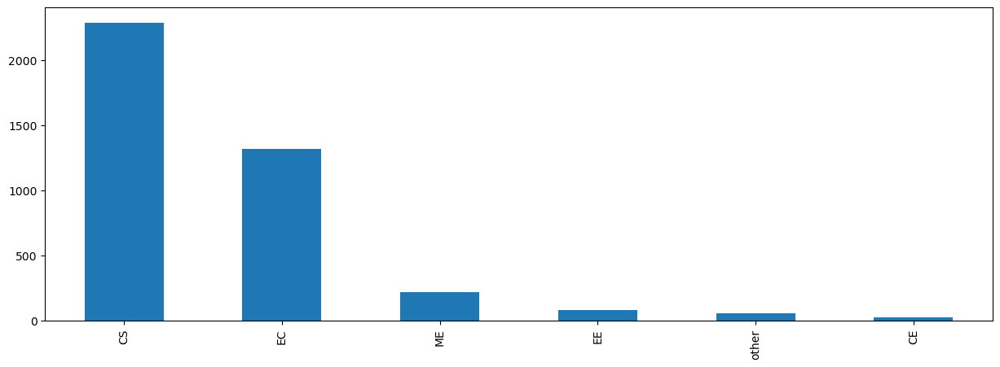

In [43]:
df['Specialization'] = df['Specialization'].map(specialization_map)

df['Specialization'].value_counts().plot(kind='bar', figsize=(15,5))

print(df['Specialization'].unique())

In [44]:
df.drop(columns=['CollegeID','CollegeCityID','CollegeCityTier'],axis=1,inplace=True)

In [45]:
df

,Salary,DOJ,DOL,Designation,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeTier,Degree,Specialization,collegeGPA,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,preprocessed,Period
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,2012-06-01,2024-02-23,senior quality engineer,f,1990-02-19,84.30,"board ofsecondary education,ap",2007,95.80,state,2,B.Tech/B.E.,CS,78.00,Andhra Pradesh,2011,515,585,525,0.635979,445,NA,NA,NA,NA,NA,NA,0.9737,0.8128,0.5269,1.35490,-0.4455,Bangalore,12
579905,500000.0,2013-09-01,2024-02-23,assistant manager,m,1989-10-04,85.40,cbse,2007,85.00,cbse,2,B.Tech/B.E.,EC,70.06,Madhya Pradesh,2012,695,610,780,0.960603,NA,466,NA,NA,NA,NA,NA,-0.7335,0.3789,1.2396,-0.10760,0.8637,Indore,11
810601,325000.0,2014-06-01,2024-02-23,systems engineer,f,1992-08-03,85.00,cbse,2010,68.20,cbse,2,B.Tech/B.E.,CS,70.00,Uttar Pradesh,2014,615,545,370,0.450877,395,NA,NA,NA,NA,NA,NA,0.2718,1.7109,0.1637,-0.86820,0.6721,Chennai,10
267447,1100000.0,2011-07-01,2024-02-23,senior software engineer,m,1989-12-05,85.60,cbse,2007,83.60,cbse,1,B.Tech/B.E.,CS,74.64,Delhi,2011,635,585,625,0.974396,615,NA,NA,NA,NA,NA,NA,0.0464,0.3448,-0.3440,-0.40780,-0.9194,Gurgaon,13
343523,200000.0,2014-03-01,2015-03-01,get,m,1991-02-27,78.00,cbse,2008,76.80,cbse,2,B.Tech/B.E.,EC,73.90,Uttar Pradesh,2012,545,625,465,0.124502,NA,233,NA,NA,NA,NA,NA,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,Manesar,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47916,280000.0,2011-10-01,2012-10-01,software engineer,m,1987-04-15,52.09,cbse,2006,55.50,cbse,2,B.Tech/B.E.,CS,61.50,Haryana,2010,365,334,475,0.276047,345,NA,NA,NA,NA,NA,NA,-0.1082,0.3448,0.2366,0.64980,-0.9194,Delhi,1
752781,100000.0,2013-07-01,2013-07-01,technical writer,f,1992-08-27,90.00,state board,2009,93.00,state,2,B.Tech/B.E.,EC,77.30,Telangana,2013,415,410,535,0.881620,325,420,NA,NA,NA,NA,NA,-0.3027,0.8784,0.9322,0.77980,-0.0943,Hyderabad,0
355888,320000.0,2013-07-01,2024-02-23,associate software engineer,m,1991-07-03,81.86,"bse,odisha",2008,65.50,state,2,B.Tech/B.E.,CS,70.00,Orissa,2012,475,475,465,0.488348,405,NA,NA,NA,NA,NA,NA,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615,Bangalore,11


In [46]:
df['Designation'].unique()

array(['senior quality engineer', 'assistant manager', 'systems engineer',
       'senior software engineer', 'get', 'system engineer',
       'java software engineer', 'mechanical engineer',
       'electrical engineer', 'project engineer', 'senior php developer',
       'senior systems engineer', 'quality assurance engineer',
       'qa analyst', 'network engineer', 'product development engineer',
       'associate software developer', 'data entry operator',
       'software engineer', 'developer', 'electrical project engineer',
       'programmer analyst', 'systems analyst', 'ase',
       'telecommunication engineer', 'application developer',
       'ios developer', 'executive assistant', 'online marketing manager',
       'documentation specialist', 'associate software engineer',
       'management trainee', 'site manager', 'software developer',
       '.net developer', 'production engineer', 'jr. software engineer',
       'trainee software developer', 'ui developer',
       'assi

# Step - 2

In [47]:
df.head()

,Salary,DOJ,DOL,Designation,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeTier,Degree,Specialization,collegeGPA,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,preprocessed,Period
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,2012-06-01,2024-02-23,senior quality engineer,f,1990-02-19,84.3,"board ofsecondary education,ap",2007,95.8,state,2,B.Tech/B.E.,CS,78.00,Andhra Pradesh,2011,515,585,525,0.635979,445,NA,NA,NA,NA,NA,NA,0.9737,0.8128,0.5269,1.35490,-0.4455,Bangalore,12
579905,500000.0,2013-09-01,2024-02-23,assistant manager,m,1989-10-04,85.4,cbse,2007,85.0,cbse,2,B.Tech/B.E.,EC,70.06,Madhya Pradesh,2012,695,610,780,0.960603,NA,466,NA,NA,NA,NA,NA,-0.7335,0.3789,1.2396,-0.10760,0.8637,Indore,11
810601,325000.0,2014-06-01,2024-02-23,systems engineer,f,1992-08-03,85.0,cbse,2010,68.2,cbse,2,B.Tech/B.E.,CS,70.00,Uttar Pradesh,2014,615,545,370,0.450877,395,NA,NA,NA,NA,NA,NA,0.2718,1.7109,0.1637,-0.86820,0.6721,Chennai,10
267447,1100000.0,2011-07-01,2024-02-23,senior software engineer,m,1989-12-05,85.6,cbse,2007,83.6,cbse,1,B.Tech/B.E.,CS,74.64,Delhi,2011,635,585,625,0.974396,615,NA,NA,NA,NA,NA,NA,0.0464,0.3448,-0.3440,-0.40780,-0.9194,Gurgaon,13
343523,200000.0,2014-03-01,2015-03-01,get,m,1991-02-27,78.0,cbse,2008,76.8,cbse,2,B.Tech/B.E.,EC,73.90,Uttar Pradesh,2012,545,625,465,0.124502,NA,233,NA,NA,NA,NA,NA,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,Manesar,1


In [48]:
df.shape

(3998, 35)

In [49]:
df.describe()

,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,GraduationYear,English,Logical,Quant,Domain,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Period
count,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,3.076998e+05,77.925443,2008.087544,74.466366,1.925713,71.486171,2012.105803,501.649075,501.598799,513.378189,0.510490,-0.037831,0.146496,0.002763,-0.169033,-0.138110,5.755128
std,2.127375e+05,9.850162,1.653599,10.999933,0.262270,8.167338,31.857271,104.940021,86.783297,122.302332,0.468671,1.028666,0.941782,0.951471,1.007580,1.008075,4.789783
min,3.500000e+04,43.000000,1995.000000,40.000000,1.000000,6.450000,0.000000,180.000000,195.000000,120.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700,0.000000
25%,1.800000e+05,71.680000,2007.000000,66.000000,2.000000,66.407500,2012.000000,425.000000,445.000000,430.000000,0.342315,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200,1.000000
50%,3.000000e+05,79.150000,2008.000000,74.400000,2.000000,71.720000,2013.000000,500.000000,505.000000,515.000000,0.622643,0.046400,0.212400,0.091400,-0.234400,-0.094300,3.000000
75%,3.700000e+05,85.670000,2009.000000,82.600000,2.000000,76.327500,2014.000000,570.000000,565.000000,595.000000,0.842248,0.702700,0.812800,0.672000,0.526200,0.502400,10.000000
max,4.000000e+06,97.760000,2013.000000,98.700000,2.000000,99.930000,2017.000000,875.000000,795.000000,900.000000,0.999910,1.995300,1.904800,2.535400,3.352500,1.822400,33.000000


In [50]:
df.corr()

C:\Users\91949\AppData\Local\Temp\ipykernel_22308\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,GraduationYear,English,Logical,Quant,Domain,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Period
Salary,1.000000,0.177373,-0.161383,0.170254,-0.179332,0.130103,-0.010053,0.178219,0.179275,0.230627,0.104656,-0.064148,0.057423,-0.010213,-0.054685,-0.011312,0.242011
10percentage,0.177373,1.000000,0.269957,0.643378,-0.126042,0.312538,-0.013799,0.350780,0.316014,0.317640,0.078563,0.067657,0.136645,-0.004679,-0.132496,0.036692,0.146359
12graduation,-0.161383,0.269957,1.000000,0.259166,0.027691,0.086001,0.014457,0.147925,0.105887,0.001379,-0.034163,0.103329,0.041182,0.061956,-0.074369,-0.015069,0.033095
12percentage,0.170254,0.643378,0.259166,1.000000,-0.100771,0.346137,-0.012933,0.212888,0.243571,0.312413,0.074099,0.058299,0.103998,-0.007486,-0.094369,0.006332,0.135446
CollegeTier,-0.179332,-0.126042,0.027691,-0.100771,1.000000,-0.086781,-0.005557,-0.183843,-0.182811,-0.251103,-0.061436,0.055174,-0.038055,0.009970,0.023778,-0.019179,-0.044159
collegeGPA,0.130103,0.312538,0.086001,0.346137,-0.086781,1.000000,0.008706,0.106478,0.196610,0.217380,0.107252,0.069582,0.068282,-0.032684,-0.074859,0.028071,0.111033
GraduationYear,-0.010053,-0.013799,0.014457,-0.012933,-0.005557,0.008706,1.000000,-0.024089,-0.024018,-0.021781,-0.009741,-0.013235,-0.002877,0.008397,-0.000417,0.016855,0.015344
English,0.178219,0.350780,0.147925,0.212888,-0.183843,0.106478,-0.024089,1.000000,0.444357,0.375784,0.089721,0.034943,0.194990,0.018755,-0.155528,0.067979,0.101046
Logical,0.179275,0.316014,0.105887,0.243571,-0.182811,0.196610,-0.024018,0.444357,1.000000,0.500152,0.169453,0.025876,0.167207,-0.006949,-0.178781,0.048420,0.107676
Quant,0.230627,0.317640,0.001379,0.312413,-0.251103,0.217380,-0.021781,0.375784,0.500152,1.000000,0.207108,-0.005639,0.103443,-0.028616,-0.131895,0.020377,0.145618


In [51]:
numericals = df.select_dtypes(include='number')

In [52]:
numericals

,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,GraduationYear,English,Logical,Quant,Domain,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Period
ID,,,,,,,,,,,,,,,,,
203097,420000.0,84.30,2007,95.80,2,78.00,2011,515,585,525,0.635979,0.9737,0.8128,0.5269,1.35490,-0.4455,12
579905,500000.0,85.40,2007,85.00,2,70.06,2012,695,610,780,0.960603,-0.7335,0.3789,1.2396,-0.10760,0.8637,11
810601,325000.0,85.00,2010,68.20,2,70.00,2014,615,545,370,0.450877,0.2718,1.7109,0.1637,-0.86820,0.6721,10
267447,1100000.0,85.60,2007,83.60,1,74.64,2011,635,585,625,0.974396,0.0464,0.3448,-0.3440,-0.40780,-0.9194,13
343523,200000.0,78.00,2008,76.80,2,73.90,2012,545,625,465,0.124502,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47916,280000.0,52.09,2006,55.50,2,61.50,2010,365,334,475,0.276047,-0.1082,0.3448,0.2366,0.64980,-0.9194,1
752781,100000.0,90.00,2009,93.00,2,77.30,2013,415,410,535,0.881620,-0.3027,0.8784,0.9322,0.77980,-0.0943,0
355888,320000.0,81.86,2008,65.50,2,70.00,2012,475,475,465,0.488348,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615,11


In [53]:
categorical = df.select_dtypes(include='object')

In [54]:
categorical

,DOL,Designation,Gender,10board,12board,Degree,Specialization,CollegeState,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,preprocessed
ID,,,,,,,,,,,,,,,,
203097,2024-02-23,senior quality engineer,f,"board ofsecondary education,ap",state,B.Tech/B.E.,CS,Andhra Pradesh,445,NA,NA,NA,NA,NA,NA,Bangalore
579905,2024-02-23,assistant manager,m,cbse,cbse,B.Tech/B.E.,EC,Madhya Pradesh,NA,466,NA,NA,NA,NA,NA,Indore
810601,2024-02-23,systems engineer,f,cbse,cbse,B.Tech/B.E.,CS,Uttar Pradesh,395,NA,NA,NA,NA,NA,NA,Chennai
267447,2024-02-23,senior software engineer,m,cbse,cbse,B.Tech/B.E.,CS,Delhi,615,NA,NA,NA,NA,NA,NA,Gurgaon
343523,2015-03-01,get,m,cbse,cbse,B.Tech/B.E.,EC,Uttar Pradesh,NA,233,NA,NA,NA,NA,NA,Manesar
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47916,2012-10-01,software engineer,m,cbse,cbse,B.Tech/B.E.,CS,Haryana,345,NA,NA,NA,NA,NA,NA,Delhi
752781,2013-07-01,technical writer,f,state board,state,B.Tech/B.E.,EC,Telangana,325,420,NA,NA,NA,NA,NA,Hyderabad
355888,2024-02-23,associate software engineer,m,"bse,odisha",state,B.Tech/B.E.,CS,Orissa,405,NA,NA,NA,NA,NA,NA,Bangalore


# Step - 3 UNIVARIATE ANALYSIS

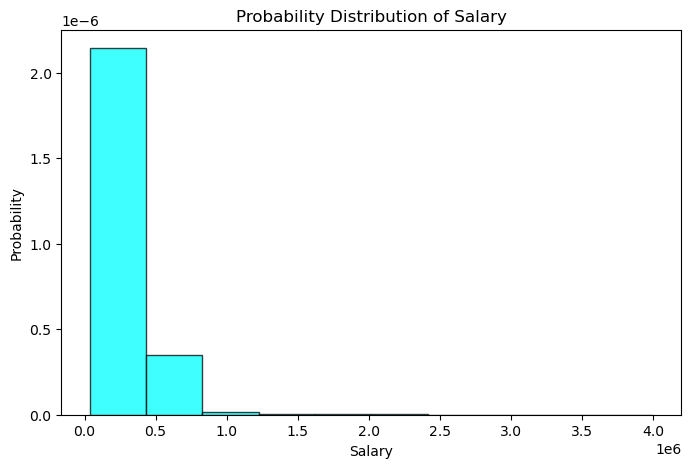

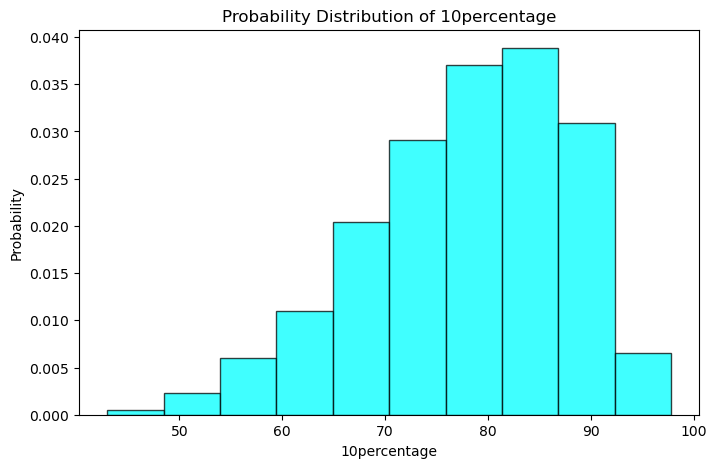

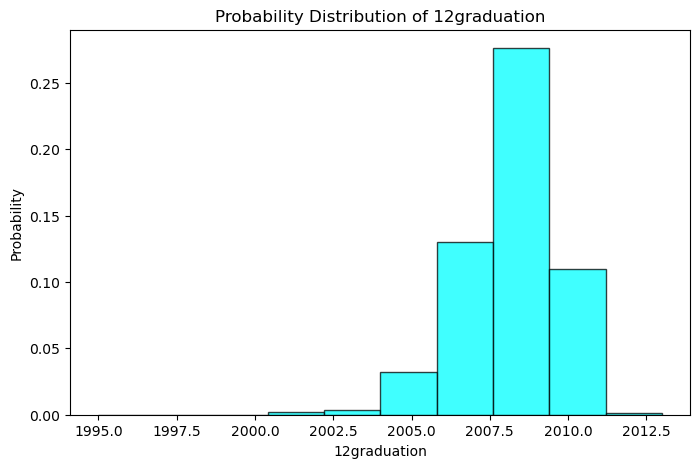

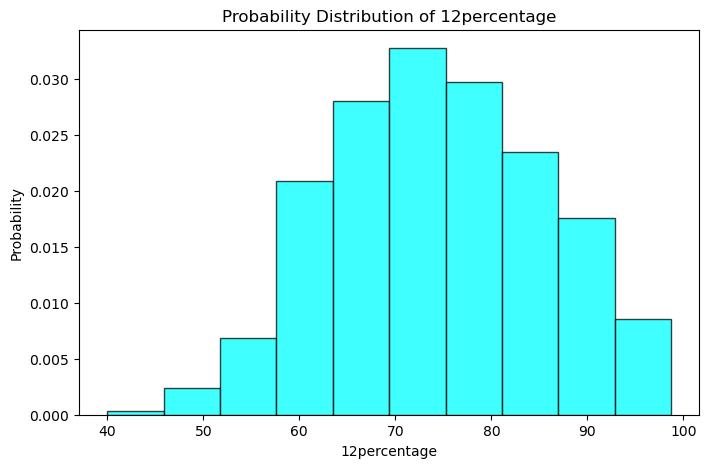

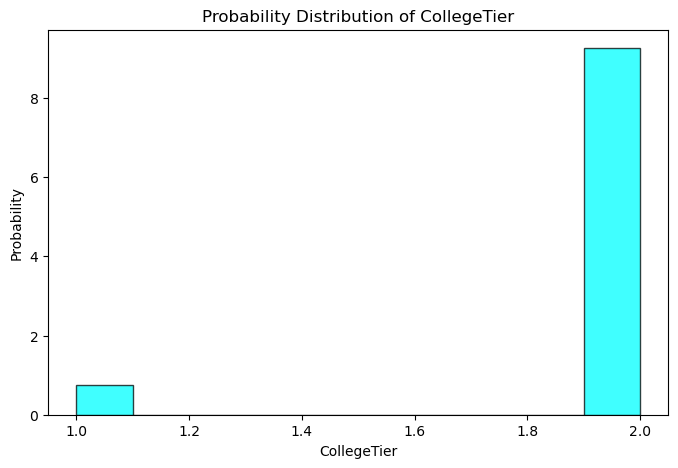

...

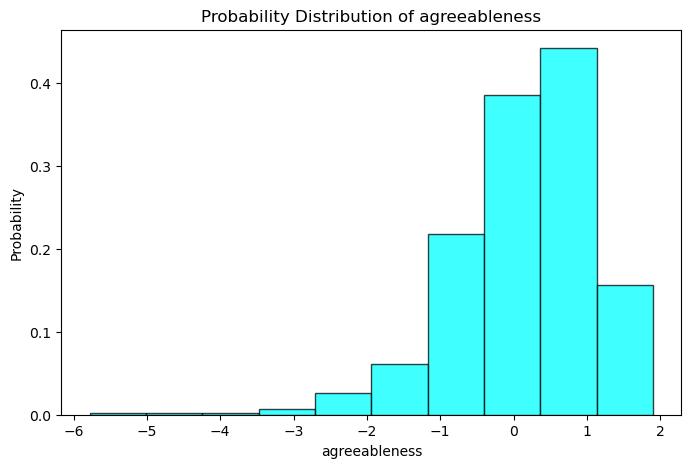

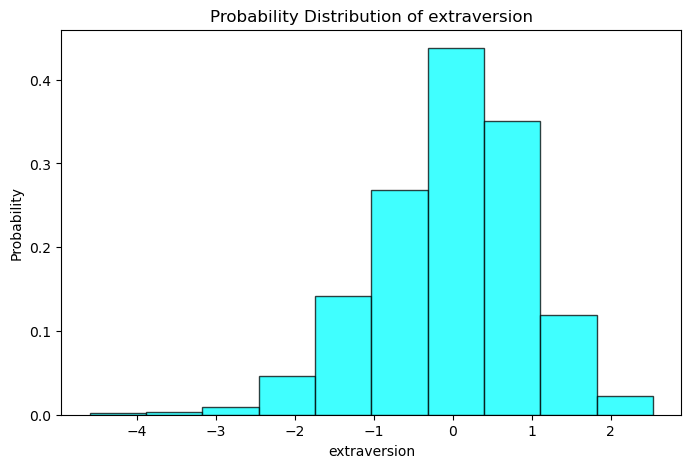

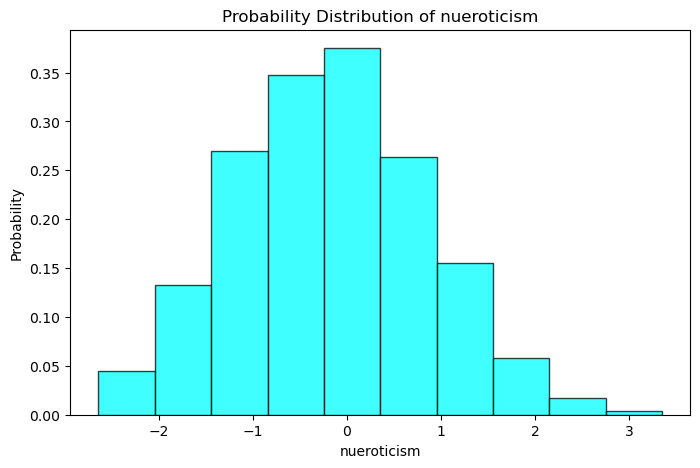

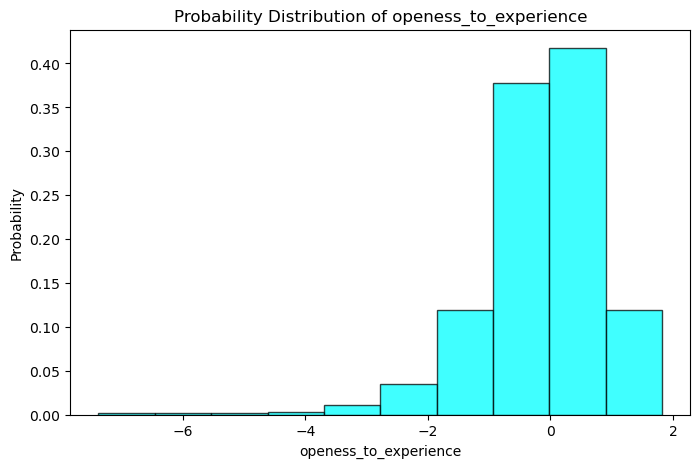

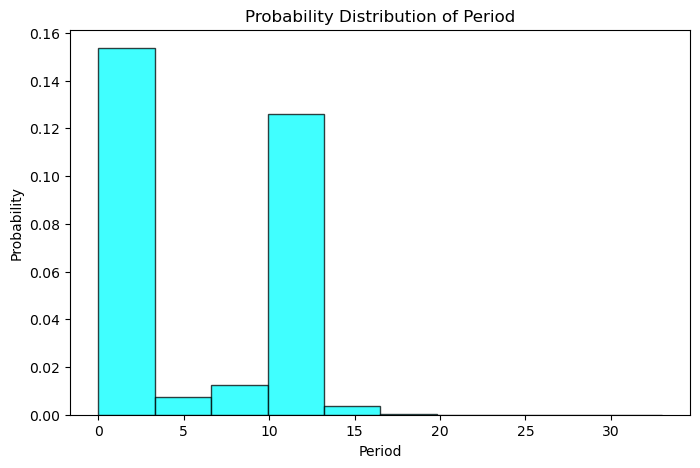

In [55]:
# Probability Distribution
for column in numericals.select_dtypes(include=np.number).columns:
    plt.figure(figsize=(8, 5))
    plt.hist(numericals[column], bins=10, density=True, alpha=0.75, color='cyan', edgecolor='black')
    plt.title(f'Probability Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Probability')
    plt.show()

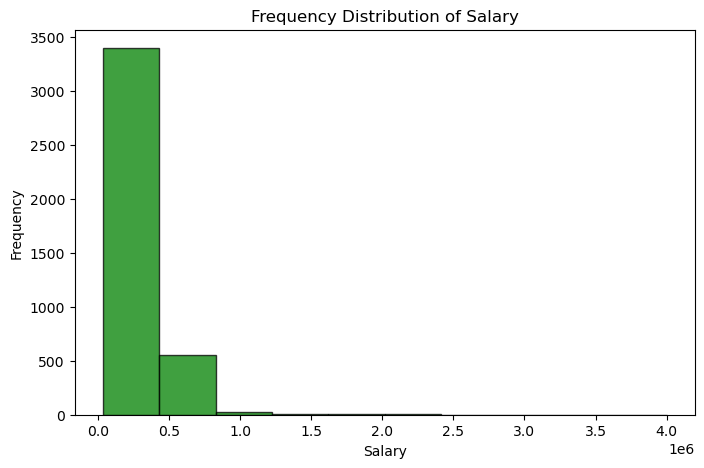

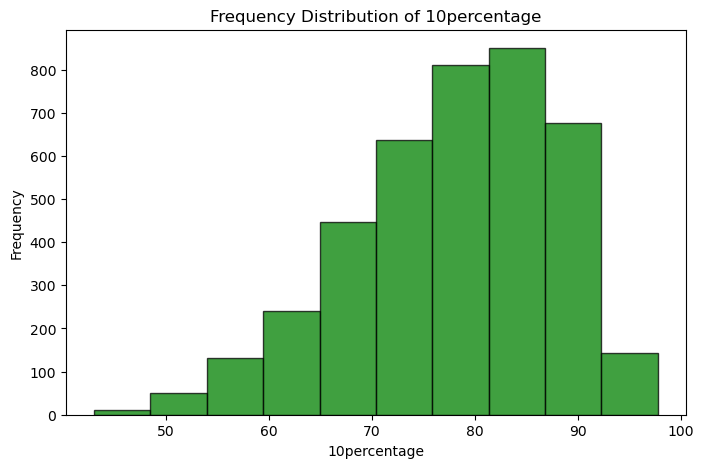

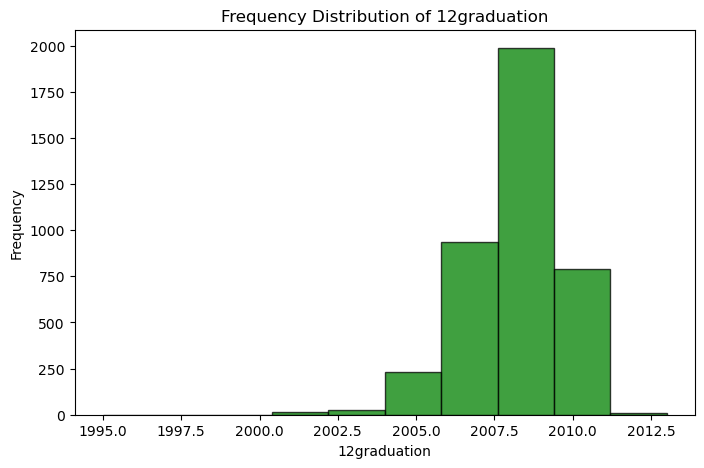

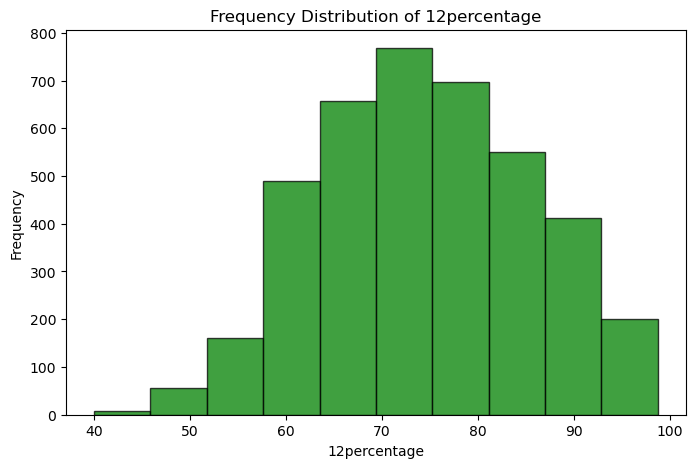

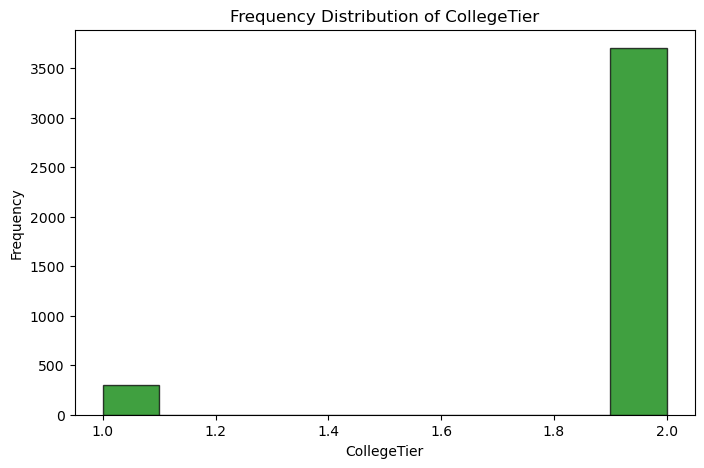

...

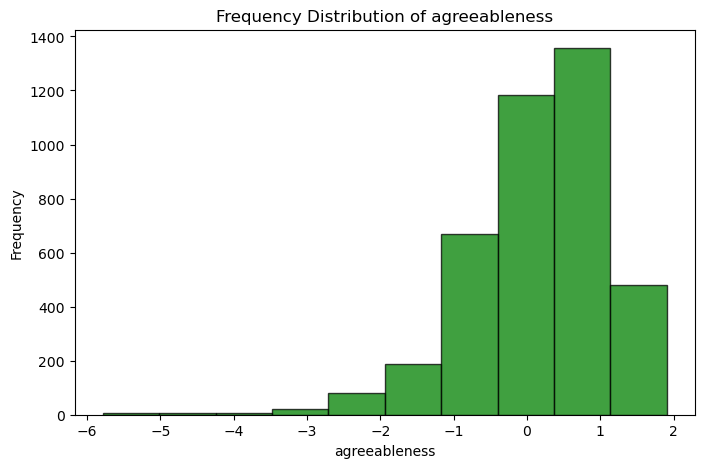

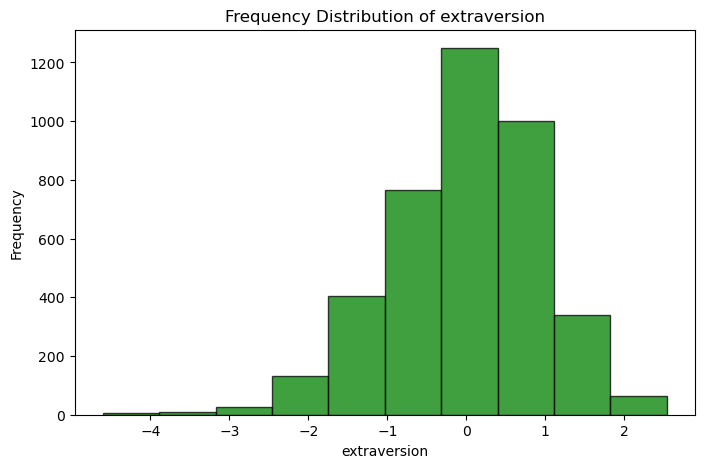

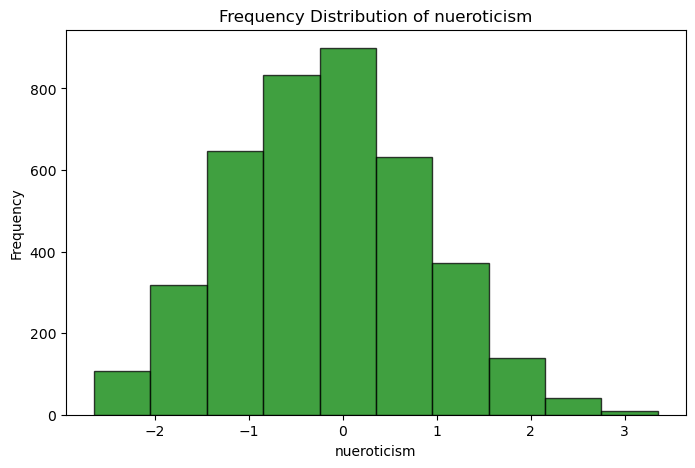

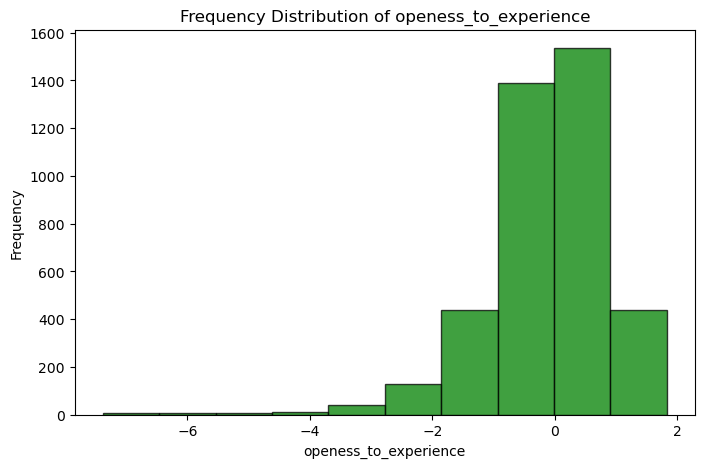

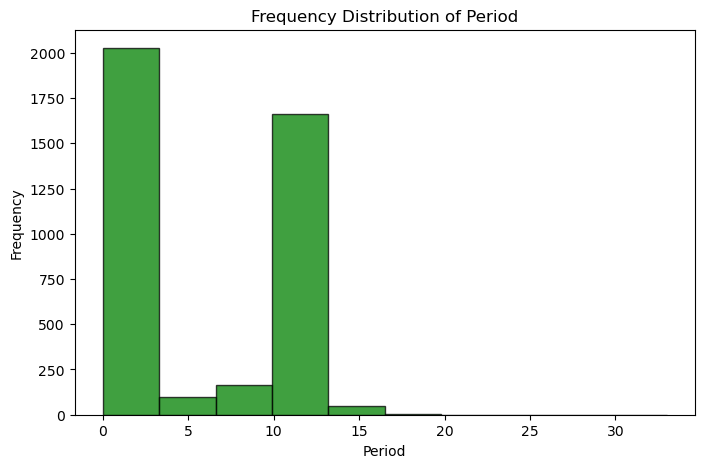

In [56]:
# Frequency Distribution
for column in numericals.select_dtypes(include=np.number).columns:
    plt.figure(figsize=(8, 5))
    plt.hist(numericals[column], bins=10, alpha=0.75, color='green', edgecolor='black')
    plt.title(f'Frequency Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

## To find outliers in each numerical column

In [57]:
Q1 = numericals.quantile(0.25)
Q3 = numericals.quantile(0.75)
IQR = Q3 - Q1

outliers = ((numericals < (Q1 - 1.5 * IQR)) | (numericals > (Q3 + 1.5 * IQR)))
print("Outliers:")
print(outliers)

Outliers:
        Salary  10percentage  12graduation  12percentage  CollegeTier  \
ID                                                                      
203097   False         False         False         False        False   
579905   False         False         False         False        False   
810601   False         False         False         False        False   
267447    True         False         False         False         True   
343523   False         False         False         False        False   
...        ...           ...           ...           ...          ...   
47916    False         False         False         False        False   
752781   False         False         False         False        False   
355888   False         False         False         False        False   
947111   False         False         False         False        False   
324966   False         False         False         False        False   

        collegeGPA  GraduationYear  Engl

In [58]:
outliers.shape

(3998, 17)

In [59]:
pd.set_option('display.max_rows',3998)

In [60]:
outliers

,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,GraduationYear,English,Logical,Quant,Domain,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Period
ID,,,,,,,,,,,,,,,,,
203097,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
579905,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
810601,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
267447,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
343523,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1027655,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False
947847,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
912934,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False
552574,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False


### Histogram

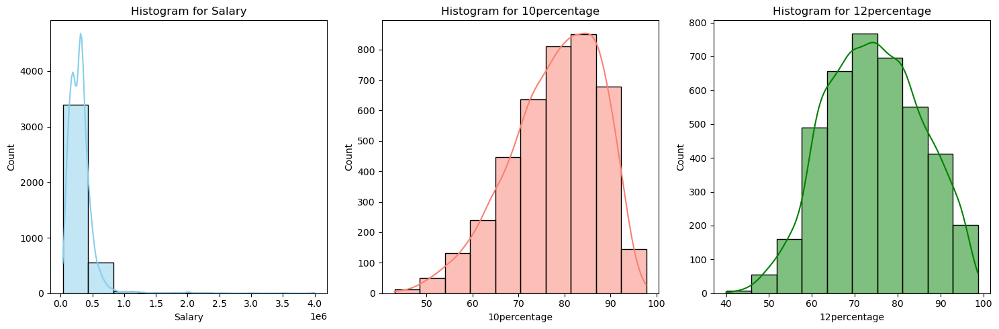

In [61]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(numericals['Salary'], bins=10, kde=True, color='skyblue')
plt.title('Histogram for Salary')

plt.subplot(1, 3, 2)
sns.histplot(numericals['10percentage'], bins=10, kde=True, color='salmon')
plt.title('Histogram for 10percentage')

plt.subplot(1, 3, 3)
sns.histplot(numericals['12percentage'], bins=10, kde=True, color='green')
plt.title('Histogram for 12percentage')

plt.tight_layout()

plt.show()

+ 1st graph gives the info about salary and the count in which they are earning that particular salary. we can see that most of the people are earning below 1000000.
+ 2nd graph gives the insights about 10th Percentage we can see that there is more density 70-90 percent which means most of them got their percentage between 70-90.
+ 3rd hist gives info about the same percentage but in 12th standard we can see most them got between 70-75 percentage.

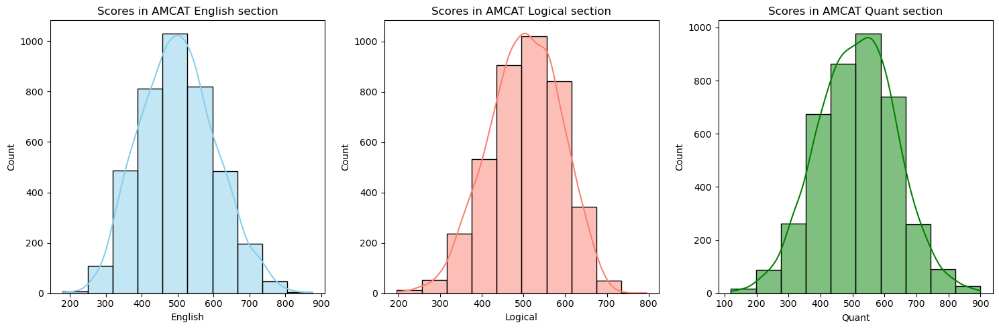

In [62]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(numericals['English'], bins=10, kde=True, color='skyblue')
plt.title('Scores in AMCAT English section')

plt.subplot(1, 3, 2)
sns.histplot(numericals['Logical'], bins=10, kde=True, color='salmon')
plt.title('Scores in AMCAT Logical section')

plt.subplot(1, 3, 3)
sns.histplot(numericals['Quant'], bins=10, kde=True, color='green')
plt.title('Scores in AMCAT Quant section')

plt.tight_layout()

plt.show()

+ From the above 3 visualizations we can see the equal ratio of marks for all the three AMCAT Sections. Most of them got marks between 500-600 in all the 3 sections.

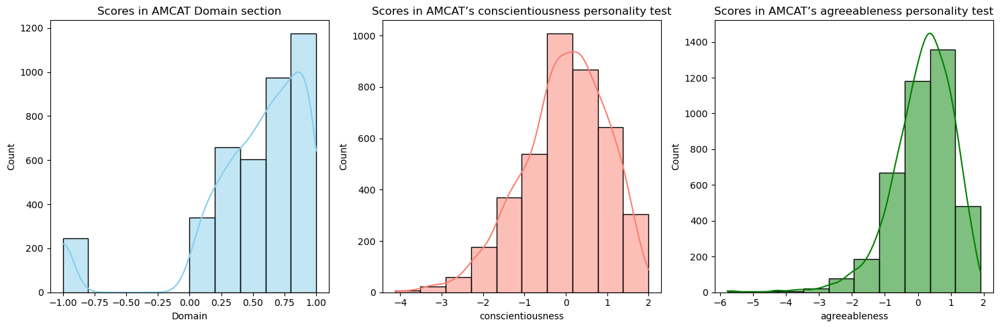

In [63]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(numericals['Domain'], bins=10, kde=True, color='skyblue')
plt.title('Scores in AMCAT Domain section')

plt.subplot(1, 3, 2)
sns.histplot(numericals['conscientiousness'], bins=10, kde=True, color='salmon')
plt.title('Scores in AMCAT’s conscientiousness personality test')

plt.subplot(1, 3, 3)
sns.histplot(numericals['agreeableness'], bins=10, kde=True, color='green')
plt.title('Scores in AMCAT’s agreeableness personality test')

plt.tight_layout()

plt.show()

+ There are the scores for the personality test. The above three graphs for different personality are completely different which means they even scored in negatives in personality tests. 

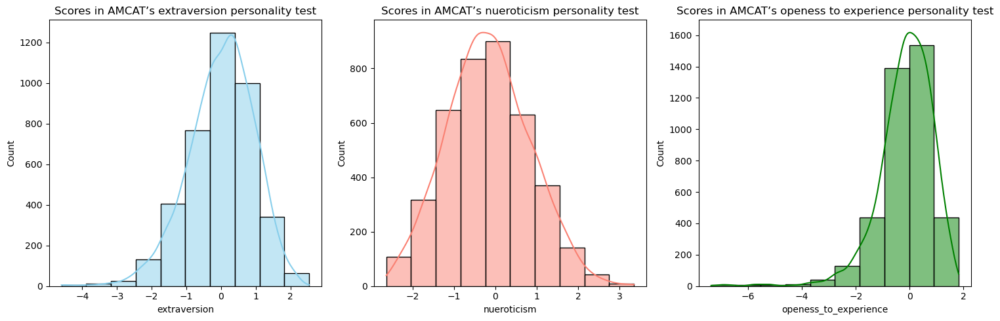

In [64]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
sns.histplot(numericals['extraversion'], bins=10, kde=True, color='skyblue')
plt.title('Scores in AMCAT’s extraversion personality test')

plt.subplot(1, 3, 2)
sns.histplot(numericals['nueroticism'], bins=10, kde=True, color='salmon')
plt.title('Scores in AMCAT’s nueroticism personality test')

plt.subplot(1, 3, 3)
sns.histplot(numericals['openess_to_experience'], bins=10, kde=True, color='green')
plt.title('Scores in AMCAT’s openess to experience personality test')

plt.tight_layout()

plt.show()

+ There Hists are the scores of another 3 AMCAT personality tests from the above visualizations we can observe that most of them scored their marks between 0-1 and some of them even scored negatives also.

In [65]:
numericals

,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,GraduationYear,English,Logical,Quant,Domain,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Period
ID,,,,,,,,,,,,,,,,,
203097,420000.0,84.30,2007,95.80,2,78.00,2011,515,585,525,0.635979,0.9737,0.8128,0.5269,1.35490,-0.4455,12
579905,500000.0,85.40,2007,85.00,2,70.06,2012,695,610,780,0.960603,-0.7335,0.3789,1.2396,-0.10760,0.8637,11
810601,325000.0,85.00,2010,68.20,2,70.00,2014,615,545,370,0.450877,0.2718,1.7109,0.1637,-0.86820,0.6721,10
267447,1100000.0,85.60,2007,83.60,1,74.64,2011,635,585,625,0.974396,0.0464,0.3448,-0.3440,-0.40780,-0.9194,13
343523,200000.0,78.00,2008,76.80,2,73.90,2012,545,625,465,0.124502,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,1
1027655,300000.0,89.92,2010,87.00,2,76.32,2014,560,555,620,-1.000000,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608,10
947847,300000.0,86.08,2010,67.50,2,72.98,2014,590,435,380,0.356536,1.7081,-0.1054,-1.0379,-2.00920,-1.0872,1
912934,400000.0,92.00,2010,91.00,1,8.58,2016,545,555,590,0.829585,-0.0154,1.2114,0.0100,0.14590,1.2470,1
552574,600000.0,90.00,2009,91.20,1,85.03,2013,615,670,530,0.694479,-0.1590,0.5454,-0.6048,-0.74150,-0.2859,11


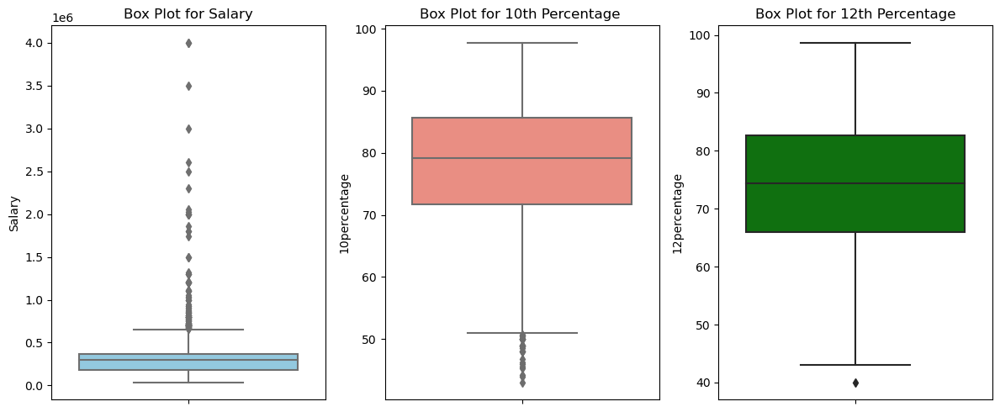

In [66]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
sns.boxplot(y=numericals['Salary'], color='skyblue')
plt.title('Box Plot for Salary')

plt.subplot(1, 3, 2)
sns.boxplot(y=numericals['10percentage'], color='salmon')
plt.title('Box Plot for 10th Percentage ')

plt.subplot(1, 3, 3)
sns.boxplot(y=numericals['12percentage'], color='green')
plt.title('Box Plot for 12th Percentage')

plt.tight_layout()

plt.show()

+ 1st box plot is visualised for salaries of employees. As we can see that the density is more in between 0.2-0.4 which means most of them getting salaries between 2lakhs to 4 lakhs adn there are many outliers which have crossed the maximum value.
+ 2nd box plot is about the 10th percentage. As we can see that most of them scored between 70% - 85% and the median is 80%. There are also many outliers who scored more less than 50%.
+ 3rd plot is for the 12th percentage there is only one outlier in the data for 12th percentage which is 40% and the median is 75%. Most of them got percentage between 65% to 85%.

# Step - 4 BIVARIATE ANALYSIS

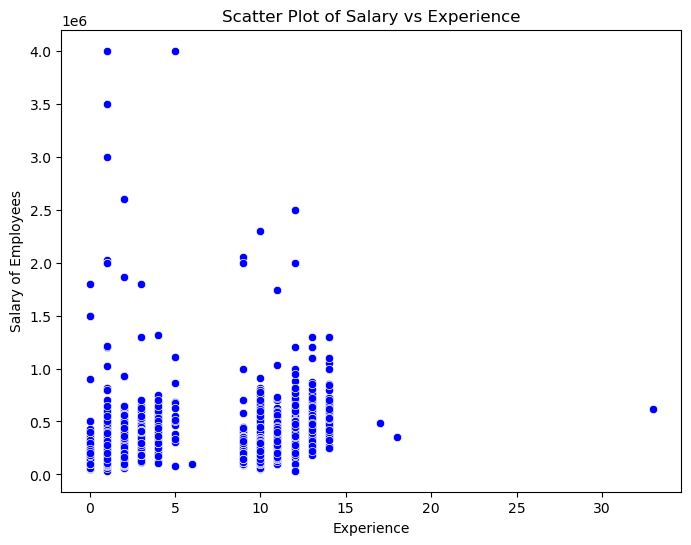

In [67]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Period', y='Salary', data=numericals, color='blue')

plt.xlabel('Experience')
plt.ylabel('Salary of Employees')
plt.title('Scatter Plot of Salary vs Experience')

plt.show()

+ The above scatter plot between the salary and experience which has been extracted from DOJ and DOL by taking the difference between the two columns.
+ As we can that the person with experience of 1.5 years is earning more salary than the person who has experience more than 30 years.
+ Most of the exployees with experience between 0-5 and 10-15 years are more and earning between 2-10 lakhs

<Figure size 800x600 with 0 Axes>

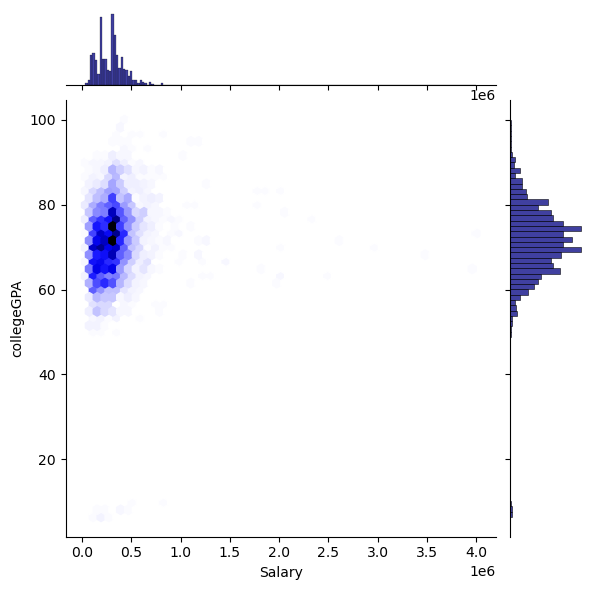

In [68]:
plt.figure(figsize=(8, 6))
sns.jointplot(x='Salary', y='collegeGPA', data=numericals, kind='hex', color='navy')

plt.show()

+ The above insight is Hexbin plot which are useful for visualizing the distribution and density of points when dealing with large data sets.
+ They are particularly used when scatter plots may result in overplotting.
+ The above Hexbin plot is plotted to get the information between GPA and salary. We can see that when the GPA is between 60-80 they are earning between 0-7 lakhs as the density is more in between those GPA.

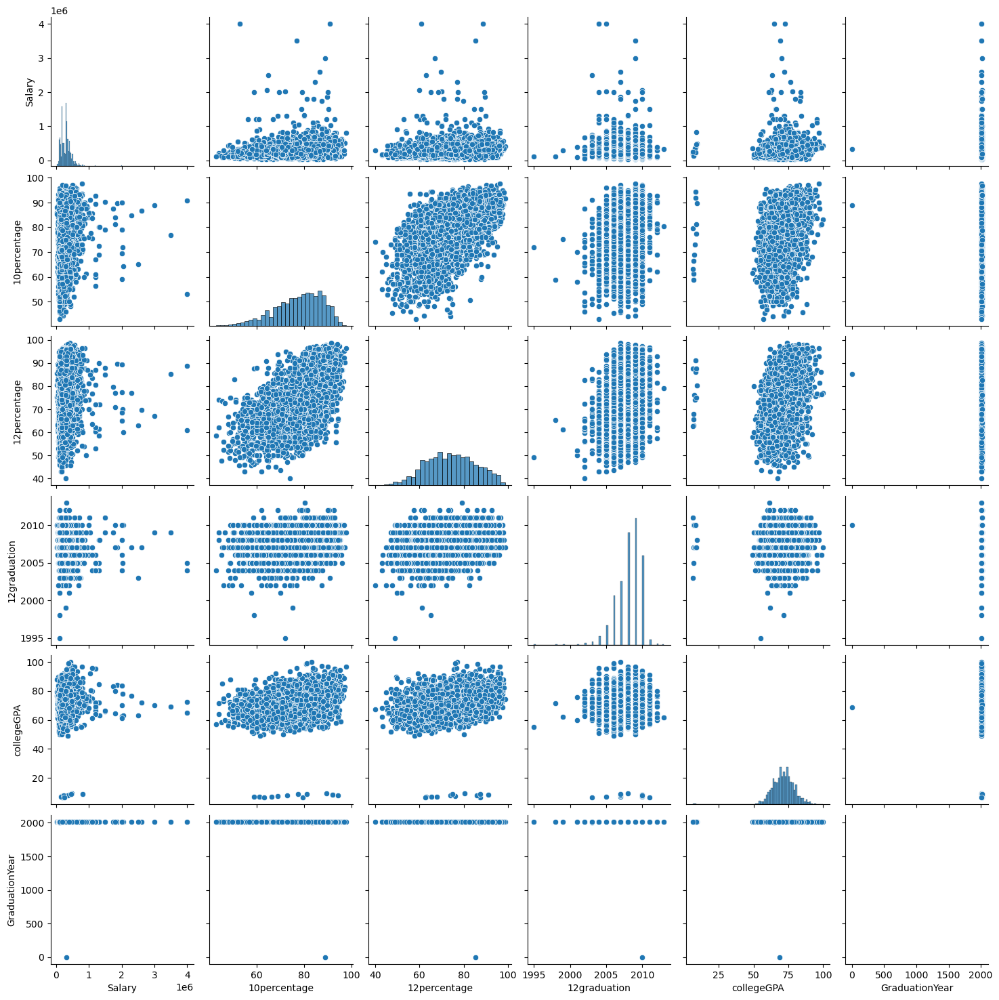

In [69]:
numerical_columns = ['Salary','10percentage','12percentage','12graduation','collegeGPA','GraduationYear']
sns.pairplot(numericals[numerical_columns])
plt.show()

+ The above pair plot is drawn for all the numericals values for their educational figures.
+ From the below corelation values we get negative values when the scatter points are not linear.

In [70]:
numericals[numerical_columns].corr()

,Salary,10percentage,12percentage,12graduation,collegeGPA,GraduationYear
Salary,1.000000,0.177373,0.170254,-0.161383,0.130103,-0.010053
10percentage,0.177373,1.000000,0.643378,0.269957,0.312538,-0.013799
12percentage,0.170254,0.643378,1.000000,0.259166,0.346137,-0.012933
12graduation,-0.161383,0.269957,0.259166,1.000000,0.086001,0.014457
collegeGPA,0.130103,0.312538,0.346137,0.086001,1.000000,0.008706
GraduationYear,-0.010053,-0.013799,-0.012933,0.014457,0.008706,1.000000


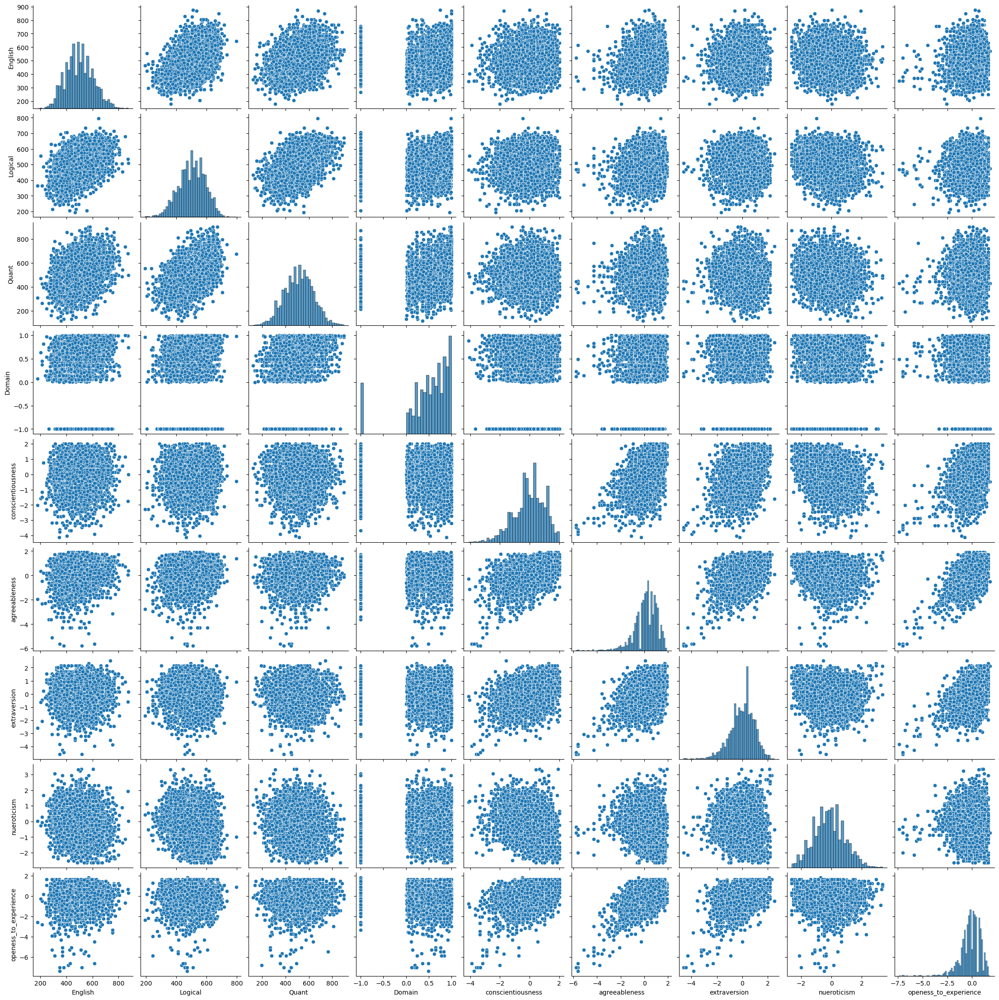

In [71]:
numerical_columns2 = ['English','Logical','Quant','Domain','conscientiousness','agreeableness','extraversion','nueroticism','openess_to_experience']
sns.pairplot(numericals[numerical_columns2])
plt.show()

+ This scatter plot plotted for all the AMCAT tests.

In [72]:
numericals[numerical_columns2].corr()

,English,Logical,Quant,Domain,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
English,1.000000,0.444357,0.375784,0.089721,0.034943,0.194990,0.018755,-0.155528,0.067979
Logical,0.444357,1.000000,0.500152,0.169453,0.025876,0.167207,-0.006949,-0.178781,0.048420
Quant,0.375784,0.500152,1.000000,0.207108,-0.005639,0.103443,-0.028616,-0.131895,0.020377
Domain,0.089721,0.169453,0.207108,1.000000,-0.039478,0.051944,-0.024647,-0.017928,0.010412
conscientiousness,0.034943,0.025876,-0.005639,-0.039478,1.000000,0.481820,0.355537,-0.330312,0.395649
agreeableness,0.194990,0.167207,0.103443,0.051944,0.481820,1.000000,0.454369,-0.207480,0.591541
extraversion,0.018755,-0.006949,-0.028616,-0.024647,0.355537,0.454369,1.000000,-0.096491,0.435074
nueroticism,-0.155528,-0.178781,-0.131895,-0.017928,-0.330312,-0.207480,-0.096491,1.000000,-0.065795
openess_to_experience,0.067979,0.048420,0.020377,0.010412,0.395649,0.591541,0.435074,-0.065795,1.000000


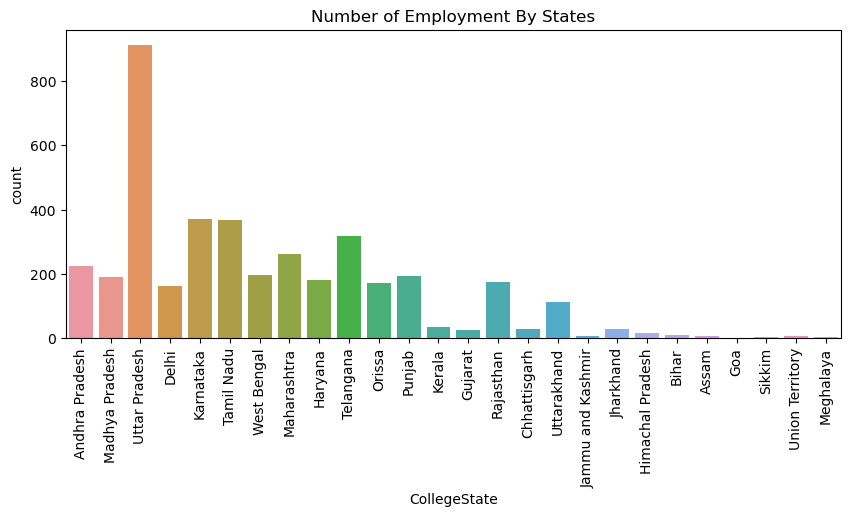

In [73]:
plt.figure(figsize=(10,4))
sns.countplot(x='CollegeState', data=df)
plt.title("Number of Employment By States")
plt.xticks(rotation=90)
#plt.text(5,6,"Hello")
plt.show()

+ From the above bar graph we can say that the count of employees are more from the Uttar Pradesh state followed by Karnataka with slight difference with Tamilnadu.
+ Least count is for Goa and Meghalaya.

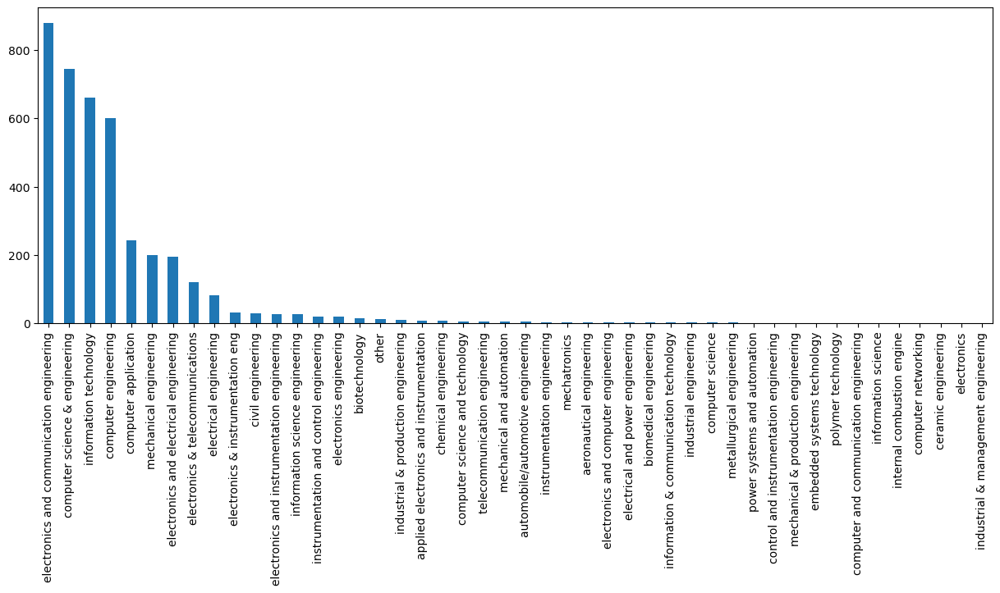

In [78]:
df['Specialization'].value_counts().plot(kind='bar',figsize=(15,5))
plt.show()

+ This plot is visualised bofore merging the sub branches to their related core branch.
+ There are more number of employees from the ECE background and next followed by CSE.

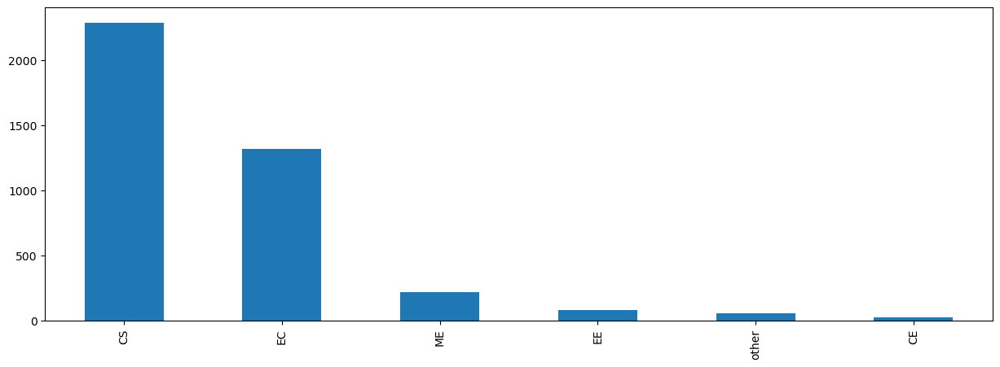

In [74]:
df['Specialization'].value_counts().plot(kind='bar',figsize=(15,5))
plt.show()

+ This plot is visualised after merging the sub brances with their related core branch.
+ As we can see that more of them are from Computer Science background with more than '2000+' members next followed by ECE.

<Axes: xlabel='Salary', ylabel='Density'>

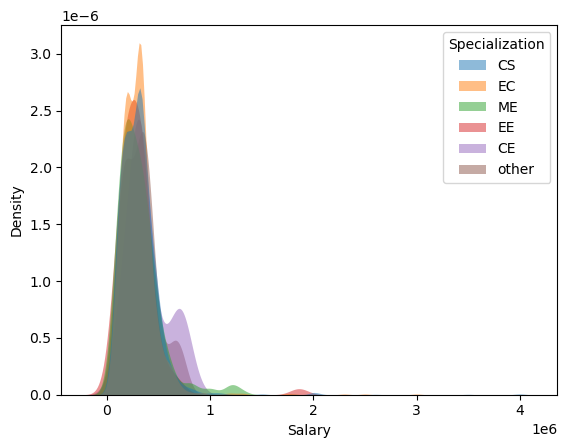

In [75]:
 sns.kdeplot(
   data=df, x="Salary",hue="Specialization",
   fill=True, common_norm=False,
   alpha=.5, linewidth=0,
)

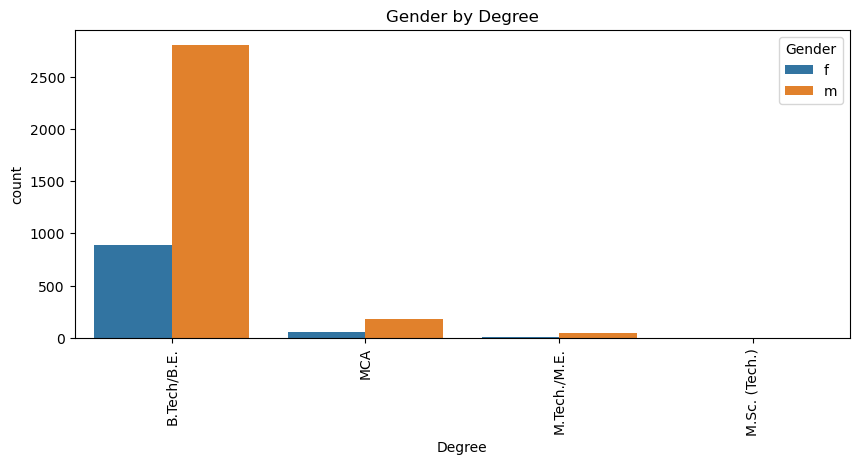

In [76]:
# Categorical vs Categorical bivariate
# hue => Categorical column. 
plt.figure(figsize=(10,4))
sns.countplot(x='Degree',hue='Gender', data=df)
plt.title("Gender by Degree")
plt.xticks(rotation=90)
#plt.text(5,6,"Hello")
plt.show()

+ The above bar graph is depicted between the count of exployees graduated from different degrees wrt Gender.
+ We can see that there are more number of male graduates from B.Tech background and even females are also more from B.Tech background.

<Axes: xlabel='Specialization', ylabel='Salary'>

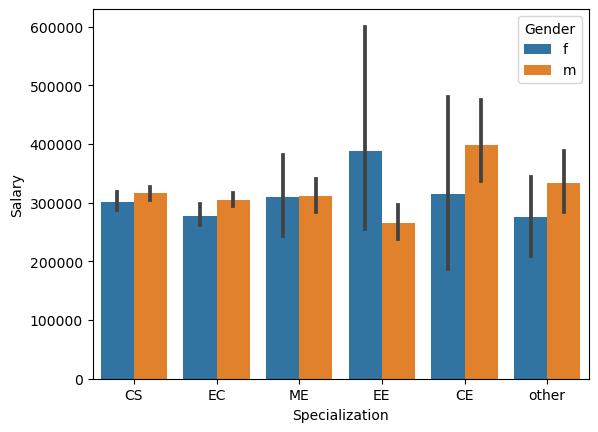

In [77]:
sns.barplot(data=df,x='Specialization',y='Salary', hue='Gender')

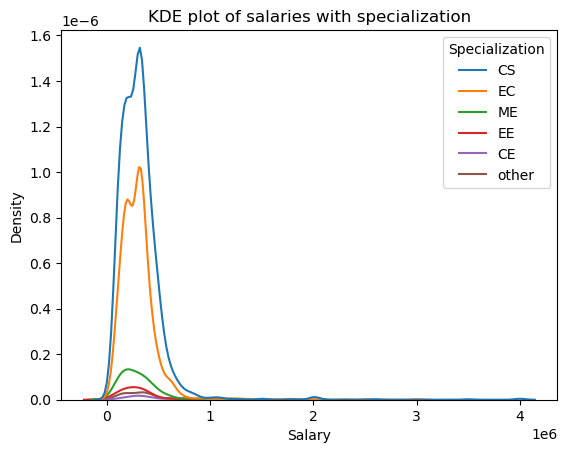

In [78]:
sns.kdeplot(x='Salary', data=df, hue='Specialization')
plt.title("KDE plot of salaries with specialization")
plt.show()

+ From the above kde plot the density of salaries for CS specialization is more because there are more number graduates from this branch and earning more.

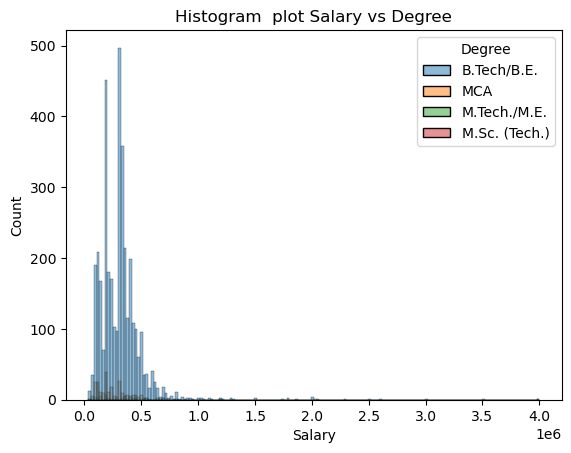

In [79]:
sns.histplot(x='Salary', data=df, hue='Degree')
plt.title("Histogram  plot Salary vs Degree")
plt.show()

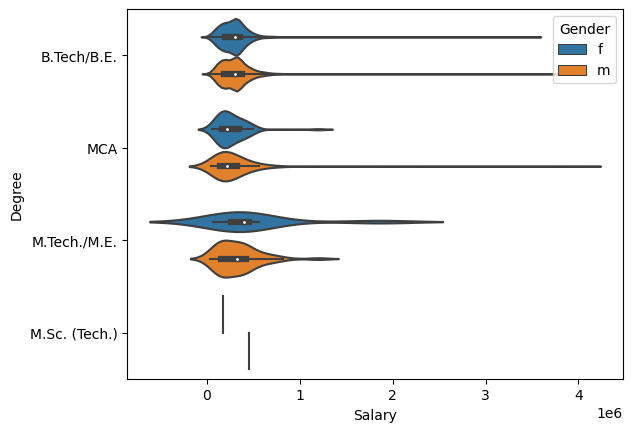

In [80]:
sns.violinplot(x='Salary',y='Degree',hue='Gender', data=df)
plt.show()

C:\Users\91949\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 94.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\91949\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 92.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\91949\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 64.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\91949\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 42.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\91949\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 10.3% of the points

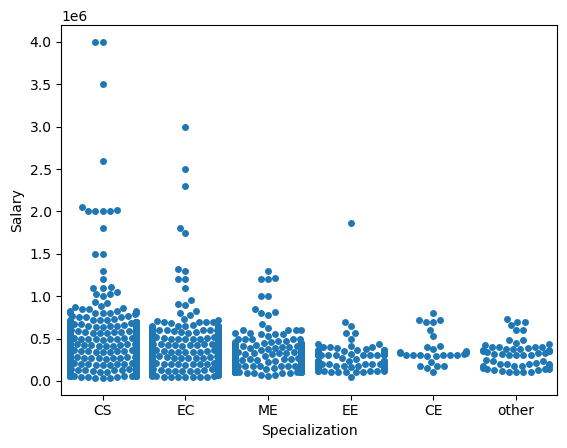

In [81]:
sns.swarmplot(x='Specialization',y='Salary', data=df)
plt.show()

+ The above visualization is swarm plot which gives distribution of individual data points within each category, giving a sense of how densely or sparsely the points are distributed.

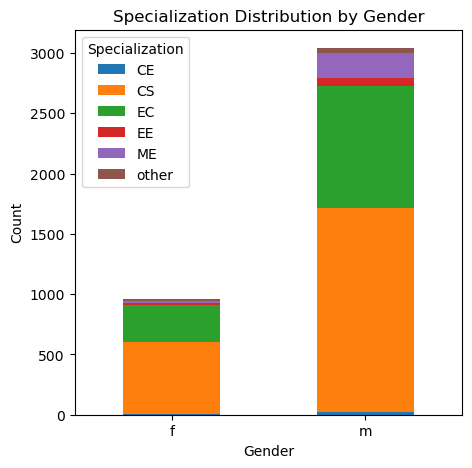

In [82]:
# Assuming df is your DataFrame
observed = pd.crosstab(df['Gender'], df['Specialization'])

# Plotting the stacked bar plot
observed.plot(kind='bar', stacked=True, figsize=(5, 5))
plt.title('Specialization Distribution by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks(rotation=0)  # Rotating x-axis labels for better readability
plt.legend(title='Specialization')
plt.show()

+ The above stacked bar graph is visualised to get the information between the two categorical values.
+ Here i considered gender with specialization to get the count of males and females  wrt to specialization.
+ There are more number of males and females who studies CS next with ECE.

<Axes: xlabel='Specialization', ylabel='Salary'>

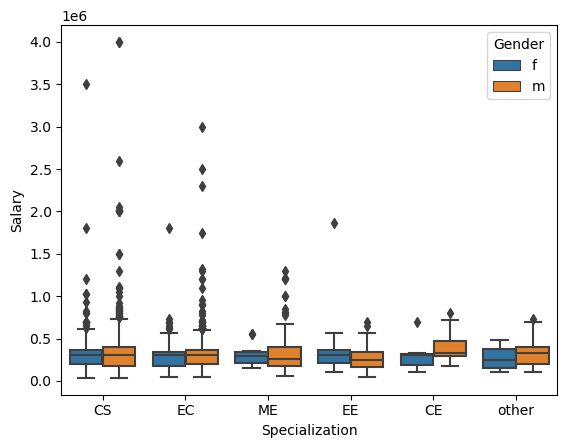

In [83]:
sns.boxplot(x = df["Specialization"],
            y = df["Salary"],
            hue = df["Gender"])

+ This Box plot gives the insights of salaries with specialization for both females and males.
+ There ae more number of outliers for CS and ECE graduates for both male and female.

# Step - 5

In [85]:
df['Designation'].nunique()

419

In [86]:
most_Designation = df['Designation'].value_counts()[:20].index.tolist()
print(most_Designation)

['software engineer', 'software developer', 'system engineer', 'programmer analyst', 'systems engineer', 'java software engineer', 'software test engineer', 'project engineer', 'technical support engineer', 'senior software engineer', 'java developer', 'test engineer', 'web developer', 'application developer', 'assistant manager', 'network engineer', 'data analyst', 'business analyst', 'engineer', 'android developer']


In [114]:
most_Designations = df[df['Designation'].isin(most_Designation)]
print(f"Unique professions : {len(df['Designation'].unique())}")
most_Designations.head()

Unique professions : 419


,Salary,DOJ,DOL,Designation,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeTier,Degree,Specialization,collegeGPA,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,preprocessed,Period,filtered_designation
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
579905,500000.0,2013-09-01,2024-02-23,assistant manager,m,1989-10-04,85.40,cbse,2007,85.0,cbse,2,B.Tech/B.E.,EC,70.06,Madhya Pradesh,2012,695,610,780,0.960603,NA,466,NA,NA,NA,NA,NA,-0.7335,0.3789,1.2396,-0.1076,0.8637,Indore,11,assistant manager
810601,325000.0,2014-06-01,2024-02-23,systems engineer,f,1992-08-03,85.00,cbse,2010,68.2,cbse,2,B.Tech/B.E.,CS,70.00,Uttar Pradesh,2014,615,545,370,0.450877,395,NA,NA,NA,NA,NA,NA,0.2718,1.7109,0.1637,-0.8682,0.6721,Chennai,10,Associate Engineer
267447,1100000.0,2011-07-01,2024-02-23,senior software engineer,m,1989-12-05,85.60,cbse,2007,83.6,cbse,1,B.Tech/B.E.,CS,74.64,Delhi,2011,635,585,625,0.974396,615,NA,NA,NA,NA,NA,NA,0.0464,0.3448,-0.3440,-0.4078,-0.9194,Gurgaon,13,Software Engineer
1027655,300000.0,2014-06-01,2024-02-23,system engineer,m,1992-07-02,89.92,state board,2010,87.0,state,2,B.Tech/B.E.,EC,76.32,Karnataka,2014,560,555,620,-1.000000,645,NA,407,NA,NA,NA,NA,-0.3027,-0.6201,-2.2954,-0.7415,-0.8608,Hyderabad,10,Associate Engineer
947847,300000.0,2014-08-01,2015-05-01,java software engineer,m,1993-02-01,86.08,state board,2010,67.5,state,2,B.Tech/B.E.,CS,72.98,Karnataka,2014,590,435,380,0.356536,405,NA,346,NA,NA,NA,NA,1.7081,-0.1054,-1.0379,-2.0092,-1.0872,Bangalore,1,Software Engineer


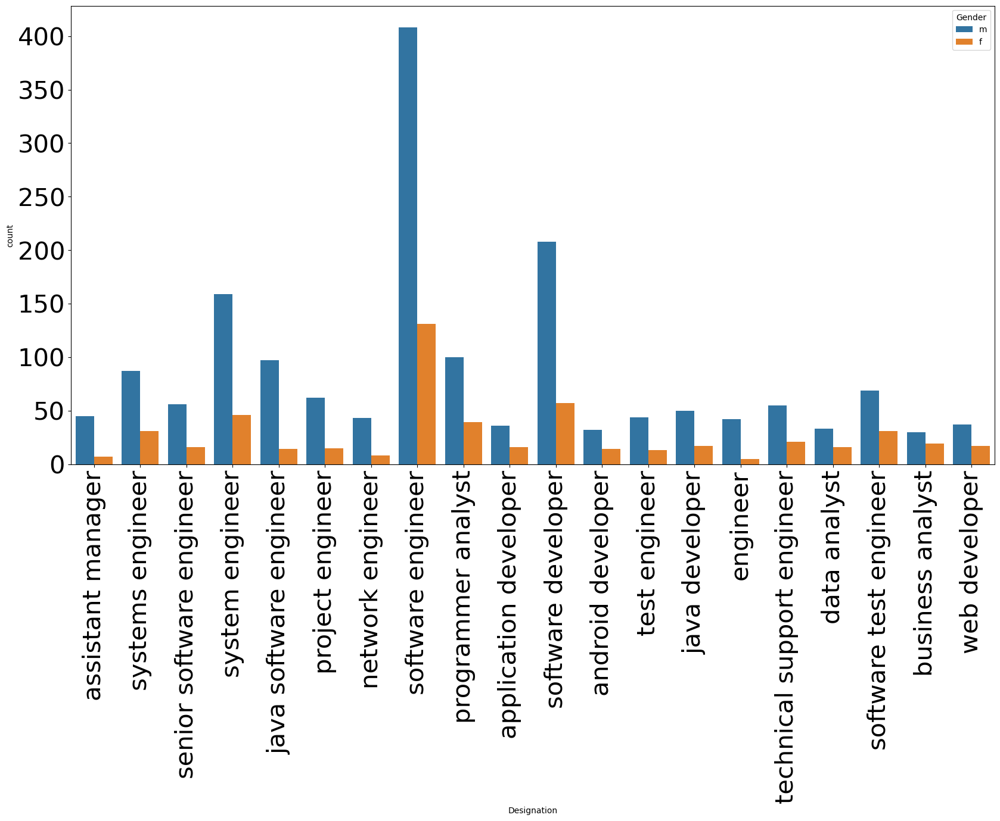

In [88]:
plt.figure(figsize=(20,10))
sns.countplot(x='Designation',hue='Gender',data=most_Designations)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)
plt.show()

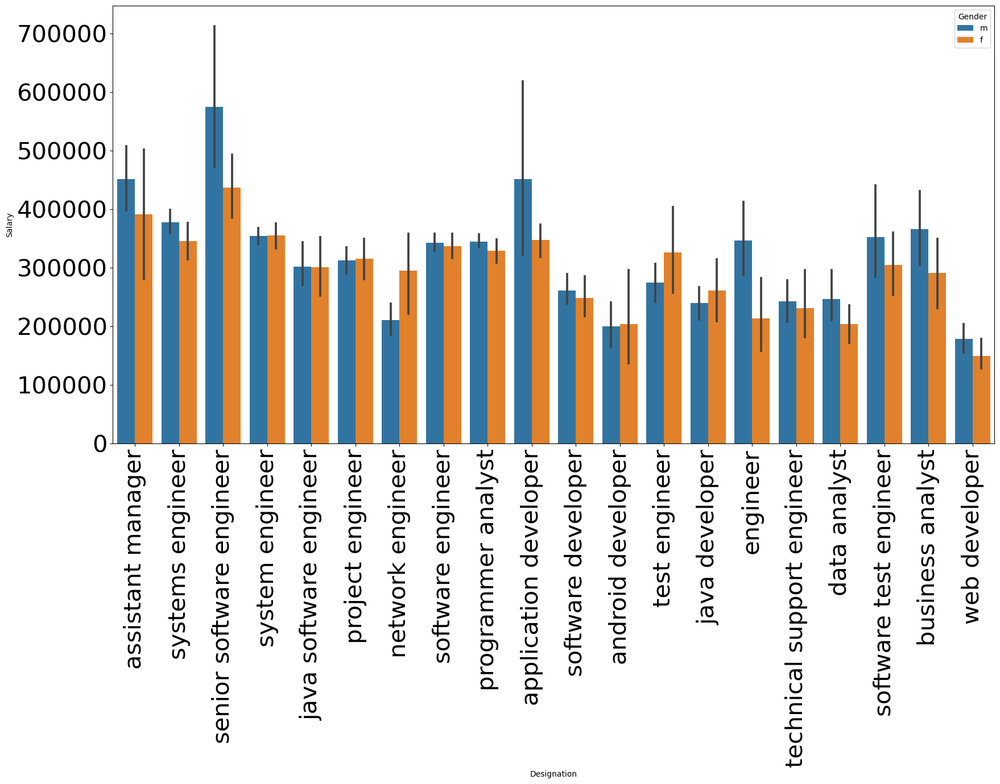

In [90]:
plt.figure(figsize=(20,10))
sns.barplot(x='Designation',y='Salary',hue='Gender',data=most_Designations)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)
plt.show()

In [91]:
### High paying designations and their relation with respect to gender
high = list(df.sort_values("Salary",ascending=False)["Designation"].unique())[:20]
high_pay = df[df['Designation'].isin(high)]
high_pay.head()

,Salary,DOJ,DOL,Designation,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeTier,Degree,Specialization,collegeGPA,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,preprocessed,Period
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
267447,1100000.0,2011-07-01,2024-02-23,senior software engineer,m,1989-12-05,85.60,cbse,2007,83.60,cbse,1,B.Tech/B.E.,CS,74.64,Delhi,2011,635,585,625,0.974396,615,NA,NA,NA,NA,NA,NA,0.0464,0.3448,-0.3440,-0.4078,-0.9194,Gurgaon,13
947847,300000.0,2014-08-01,2015-05-01,java software engineer,m,1993-02-01,86.08,state board,2010,67.50,state,2,B.Tech/B.E.,CS,72.98,Karnataka,2014,590,435,380,0.356536,405,NA,346,NA,NA,NA,NA,1.7081,-0.1054,-1.0379,-2.0092,-1.0872,Bangalore,1
1279958,300000.0,2013-07-01,2024-02-23,java software engineer,m,1992-07-02,81.20,state board,2008,79.90,state,2,B.Tech/B.E.,EC,67.67,Uttar Pradesh,2013,395,565,645,-1.000000,495,NA,376,NA,NA,NA,NA,0.7027,0.7119,0.0100,-0.9950,0.6721,Bangalore,11
466888,325000.0,2014-09-01,2024-02-23,software engineer,f,1990-11-30,79.00,cbse,2008,62.20,cbse,2,B.Tech/B.E.,CS,76.30,Uttar Pradesh,2012,485,445,435,0.864685,525,NA,NA,NA,NA,NA,NA,0.8192,0.2668,-0.2714,-0.4078,-0.1295,Pune,10
140069,320000.0,2010-11-01,2012-09-01,software engineer,f,1988-07-25,91.20,karnataka secondary school of examination,2006,84.63,state,2,B.Tech/B.E.,CS,78.15,Karnataka,2010,455,535,445,0.635979,445,NA,NA,NA,NA,NA,NA,-0.1082,0.9688,0.5269,-0.2902,0.3444,Bangalore,2


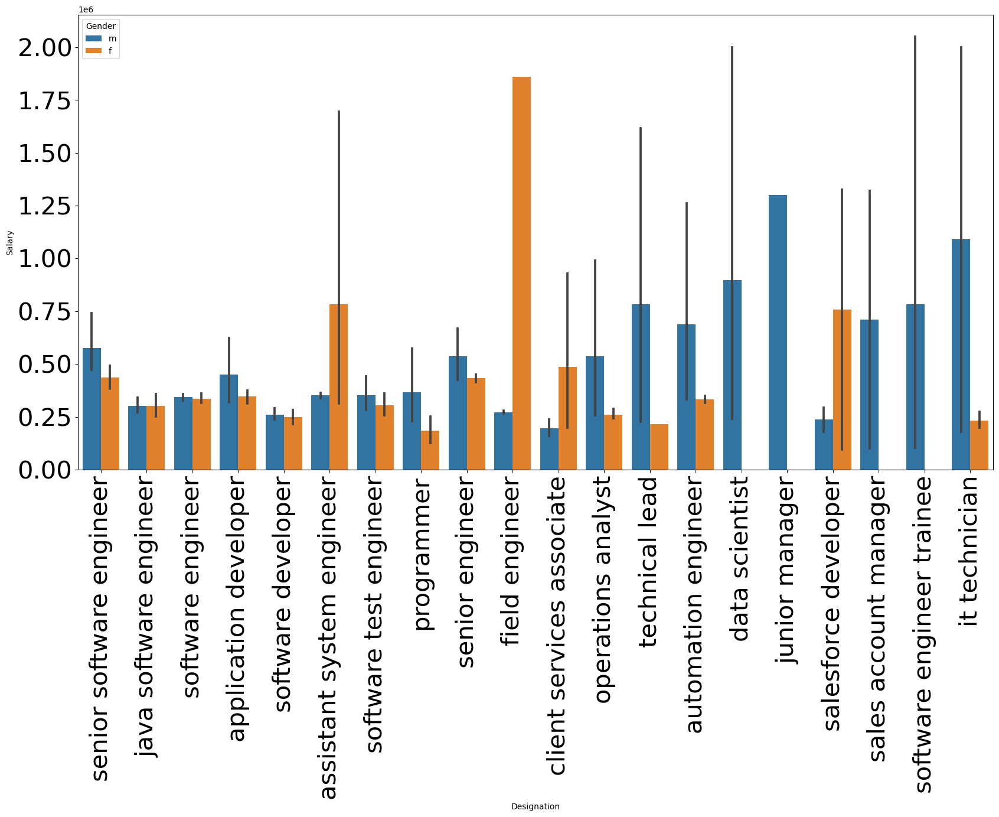

In [92]:
plt.figure(figsize=(20,10))
sns.barplot(x='Designation',y='Salary',hue='Gender',data=high_pay)
plt.xticks(fontsize=30,rotation=90)
plt.yticks(fontsize=30)
plt.show()

C:\Users\91949\anaconda3\Lib\site-packages\seaborn\axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
C:\Users\91949\anaconda3\Lib\site-packages\seaborn\axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)


For Whole dataset
Gender
f    6.631579
m    6.239308
Name: Period, dtype: float64
********************
For High_paying jobs
Gender
f    5.809822
m    5.737915
Name: Period, dtype: float64


<Figure size 2000x500 with 0 Axes>

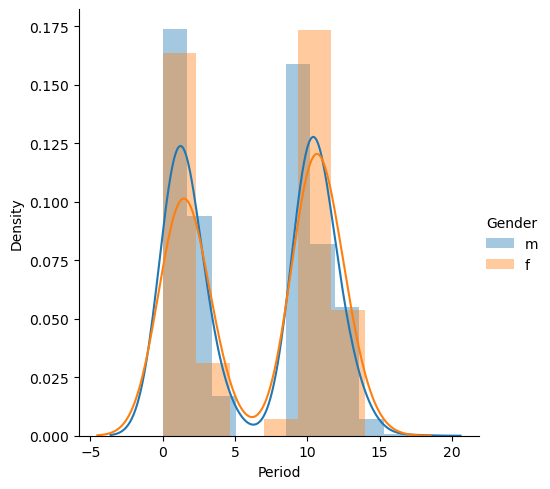

In [93]:
### Lets us check experience distribution of both male and female
plt.figure(figsize=(20,5))

sns.FacetGrid(high_pay, hue="Gender",height=5) \
   .map(sns.distplot, "Period") \
   .add_legend()
print('For Whole dataset')
print(high_pay.groupby('Gender').Period.mean())
print('*'*20)
print('For High_paying jobs')
print(df.groupby('Gender').Period.mean())

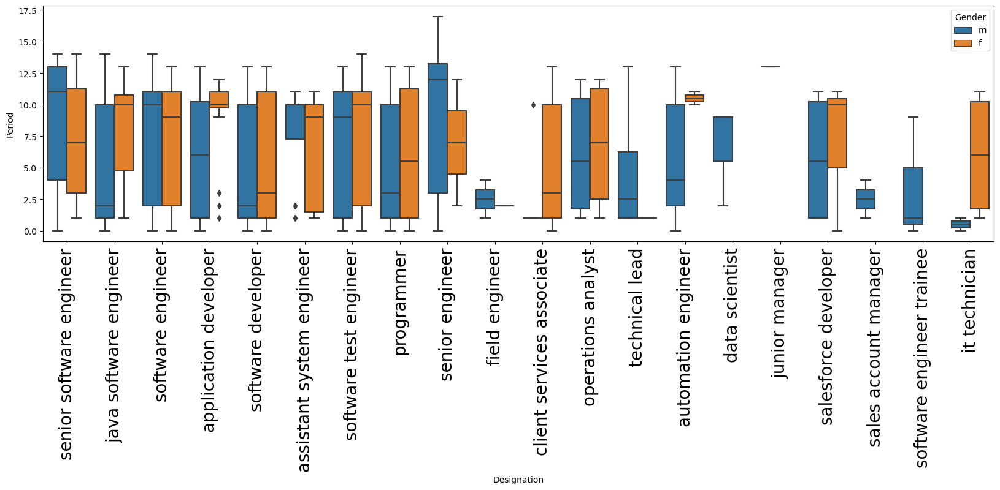

In [94]:
plt.figure(figsize=(20,5))
sns.boxplot(data=high_pay,x='Designation',y='Period',hue='Gender')
plt.xticks(fontsize=20,rotation=90)
plt.show()

In [95]:
df['Designation']

ID
203097                    senior quality engineer
579905                          assistant manager
810601                           systems engineer
267447                   senior software engineer
343523                                        get
1027655                           system engineer
947847                     java software engineer
912934                        mechanical engineer
552574                        electrical engineer
1203363                          project engineer
87291                        senior php developer
190393                    senior systems engineer
606655                 quality assurance engineer
431800                                 qa analyst
1279958                    java software engineer
536517                           network engineer
1087625              product development engineer
874596               associate software developer
711342                        data entry operator
466888                          software engine

In [97]:
from fuzzywuzzy import process

def correct_spelling_errors(target_word="", choices=[], threshold=75):
    match, score = process.extractOne(target_word, choices)
    if score >= threshold:
        return match
    else:
        return target_word

In [113]:
correct_spelling_errors(target_word="software engi", choices=choices)

'Software Engineer'

In [100]:
choices = ['Programming Analyst','Software Engineer', 'Hardware Engineer', 'Associate Engineer']

In [101]:
df['filtered_designation'] = df['Designation'].apply(lambda job: correct_spelling_errors(str(job), choices))

In [103]:
required = df[['Salary','filtered_designation','Period']]

In [104]:
required

,Salary,filtered_designation,Period
ID,,,
203097,420000.0,senior quality engineer,12
579905,500000.0,assistant manager,11
810601,325000.0,Associate Engineer,10
267447,1100000.0,Software Engineer,13
343523,200000.0,get,1
1027655,300000.0,Associate Engineer,10
947847,300000.0,Software Engineer,1
912934,400000.0,mechanical engineer,1
552574,600000.0,electrical engineer,11


In [105]:
selected_rows = required[required['filtered_designation'].isin(['Programming Analyst','Software Engineer','Hardware Engineer','Associate Engineer'])][['filtered_designation', 'Salary','Period']]

In [106]:
filtered_df = selected_rows[selected_rows['Period'] == 0][['filtered_designation', 'Salary','Period']]

In [107]:
filtered_df

,filtered_designation,Salary,Period
ID,,,
918981,Software Engineer,145000.0,0
472956,Software Engineer,220000.0,0
1044453,Associate Engineer,310000.0,0
1225896,Programming Analyst,120000.0,0
543139,Software Engineer,110000.0,0
1069569,Software Engineer,300000.0,0
927996,Associate Engineer,325000.0,0
1168723,Associate Engineer,500000.0,0
1123185,Software Engineer,100000.0,0


In [108]:
filtered_df['filtered_designation'].unique()

array(['Software Engineer', 'Associate Engineer', 'Programming Analyst'],
      dtype=object)

In [109]:
filtered_df['filtered_designation'].count()

109

In [110]:
filtered_df['Salary'].mean()

251743.11926605506

In [111]:
filtered_df['Salary'].std()

154548.88976378037

In [112]:
import scipy.stats as stats
from scipy import stats as st

In [122]:
def two_tail_ztest(samp_mean,pop_mean,std,n,alpha):
    Z_cal = (samp_mean - pop_mean) / (std/(n**0.5))
    Z_critical = st.norm.ppf(1-alpha/2)
    
    print("Calculated Z value",Z_cal)
    print("Critical Z value",Z_critical)
    
    if Z_cal > (Z_critical):
        print("Reject Null Hypothesis(H0)")
    elif Z_cal < (-Z_critical):
        print("Reject Null Hypothesis(H0)")
    else:
        print("Failed to reject null hypothesis(H0)")

In [124]:
two_tail_ztest(275000,251743.11,154548.88,109,0.05)

Calculated Z value 1.5710826247593437
Critical Z value 1.959963984540054
Failed to reject null hypothesis(H0)


# Step - 6 Conclusion

Based on our hypothesis test comparing the sample mean salary to the claimed population mean salary, we failed to reject the null hypothesis. This suggests that, according to the available sample data, there is not enough evidence to conclude that the sample mean salary significantly deviates from the claimed population mean salary mentioned in the Times of India article. It is important to acknowledge the limitations of the analysis, including the sample size and potential variations in salaries within the specified job roles.

# Step - 7 

## (Bonus) Come up with some interesting conclusions or research questions (such as step-5).

### Research Questions
Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.
Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)


In [116]:
most_degree = df['Degree'].value_counts()[:20].index.tolist()
print(most_degree)

['B.Tech/B.E.', 'MCA', 'M.Tech./M.E.', 'M.Sc. (Tech.)']


In [ ]:
most_Designations = df[df['Designation'].isin(most_Designation)]
print(f"Unique professions : {len(df['Designation'].unique())}")
most_Designations.head()